<a href="https://colab.research.google.com/github/danielsoy/ALOCC-CVPR2018/blob/master/sin_segmetacion_central_six_botellas_mvtec.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# UNSUPERVISED ANOMALY SEGMENTATION
### This is a implementation of **DFR: Deep Feature Reconstruction for Unsupervised Anomaly Segmentation** https://arxiv.org/abs/2012.07122
#### We train only with OK images, and then we predict a hotmap, where high areas are presumably anomalous
#### The pretrained weights provided by me (input anomalysegmentation-weights) are not very good because Kaggle limits training time to 9hrs

CAMBIAR DOS PATH HACIA EL DATASET, RAIZ(SCREW X EJEMPLO), Y TEST. EN DRIVE, AGRUPAR TODOS LOS DEFECTOS, EN LA CARPETA MAL.
Y CAMBIAR EL NOMBRE DE GOOD A BIEN.
cOLOCAR  1 EPOCH PARA PROBAR SI LLEGA LA NOTEBOOK AL FINAL. 

In [1]:
# https://www.kaggle.com/danieldelro/unsupervised-anomaly-segmentation-of-screw-images/data?scriptVersionId=80138081

## IMPORTS

In [2]:
!pip install tqdm

In [3]:
import tensorflow as tf  
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras import Input, Model, Sequential
from tensorflow.keras import layers

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

from skimage import io
from skimage.transform import resize

import numpy as np

from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
import cv2

import random
import os
from tqdm import tqdm

from random import randrange

In [8]:
from google.colab import drive

In [9]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Custom Data Generator

In [11]:
class CustomDataGen(tf.keras.utils.Sequence):    #/content/drive/MyDrive/screw/test
    
    def __init__(self, path = "/content/drive/MyDrive/mask rotate",# aca dir raiz del dataset, este caso:screw
                  batch_size = 1,
                 input_size=(224, 224),
                 shuffle=True, seed = None, subset = 'training'):
        
        self.image_data_generator = ImageDataGenerator(rescale=1. / 255, data_format='channels_last',     
            #zoom_range = 0.1,
            #width_shift_range = 0.05,
            #height_shift_range = 0.05,
            #brightness_range=(0.9,1.10)
        )
        
        if seed is None:
            random.randint(0, 2**32)
            
        self.batch_size = batch_size
        self.input_size = input_size
        
        self.X_paths = [os.fsdecode(file) for file in os.scandir(f"{path}/train/good")]
        self.X_train, self.X_val = train_test_split(self.X_paths, test_size=0.2, random_state = seed, shuffle = True)
        
        if subset == 'training':            
            self.X = self.X_train
        elif subset == 'validation':
            self.X = self.X_val
            
        self.n = len(self.X)
    
    
    def __getitem__(self, index):
        
        data_x = []
        
        for i in range(self.batch_size):
            image = cv2.imread(self.X[self.batch_size * index + i])
            
            image = self.image_data_generator.random_transform(image)
            
            image = image / 255
            
            image = tf.image.resize(image, self.input_size)
            data_x.append(image)
            
        data_x = np.array(data_x)
        
        return data_x, data_x
    
    def __len__(self):            
        return self.n // self.batch_size

In [12]:
INPUT_SIZE = (224,224)
seed = random.randint(0, 2**32)
train_datagen = CustomDataGen(input_size = INPUT_SIZE, batch_size = 1, seed = seed)
validation_datagen = CustomDataGen(input_size = INPUT_SIZE, subset = "validation", seed = seed) 
#/content/drive/MyDrive/SCREW/train/good

In [ ]:
#Check we dont have the same images in train and validation sets
any([value in train_datagen.X for value in validation_datagen.X])

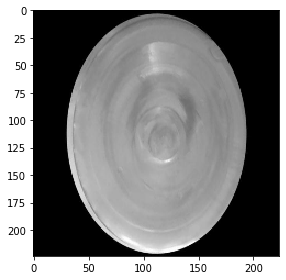

In [14]:
x, y = train_datagen[0]
io.imshow(x[0])
io.show()

## Model

In [15]:
input_model_filepath = "../content/anomaly-segmentation-model_vgg19.h5"
output_model_filepath = "./anomaly-segmentation-model.h5"
#model class
#Implementation of DFR: Deep Feature Reconstruction for Unsupervised Anomaly Segmentation https://arxiv.org/abs/2012.07122
class AnomalySegmentator(tf.keras.Model):
    def __init__(self, init_layer = 0, end_layer = None):
        super(AnomalySegmentator, self).__init__()
        #self.L2_weight = 1e-6
        self.init_layer = init_layer
        self.end_layer = end_layer
        
    def build_autoencoder(self, c0, cd):
        self.autoencoder = Sequential([
            layers.InputLayer((self.map_shape[0]//4, self.map_shape[1]//4, c0)),
            layers.Conv2D((c0 + cd) // 2,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(2*cd,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(cd,(1,1), padding='same'),
            layers.Conv2D(2*cd,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D((c0 + cd) // 2,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(c0,(1,1), padding='same')            
            
        ])
        
    def build(self, input_shape):
        
   ##   self.vgg = VGG19(include_top = False, weights = None, input_shape=input_shape[1:])    # original 
        self.vgg = VGG19(include_top = False, weights = 'imagenet', input_shape=input_shape[1:])  # weights=None, sin pesos


        self.features_list = [layer.output for layer in self.vgg.layers if 'conv' in layer.name][self.init_layer:self.end_layer]
        
        self.feature_extractor = Model(inputs = self.vgg.input, 
                                       outputs = self.features_list)
        self.feature_extractor.trainable = False   
        
        self.threshold = tf.Variable(0, trainable = False, dtype = tf.float32)

        self.map_shape = self.features_list[0].shape[1:-1]
        
        self.average_pooling = layers.AveragePooling2D(pool_size=(4, 4), strides=(4,4))       
        
        
        
        self.c0 = sum([feature.shape[-1] for feature in self.features_list])        
        self.cd = 40        
        self.build_autoencoder(self.c0, self.cd)
        
          
    def call(self, inputs):
        features = self.feature_extractor(inputs)
        resized_features = [tf.image.resize(feature, self.map_shape) for feature in features]
        resized_features = tf.concat(resized_features, axis = -1)
        
        resized_features = self.average_pooling(resized_features)

        autoencoder_output = self.autoencoder(resized_features)
        return tf.reduce_sum((autoencoder_output - resized_features)**2, axis = -1)
        
    def reconstruction_loss(self):
        @tf.function
        def _loss(y_true, y_pred):
            loss = tf.reduce_mean(y_pred, axis = (1,2)) / (tf.cast(tf.shape(y_pred)[0], tf.float32) * self.c0)
            return loss
                    
        return _loss

    def compute_threshold(self, data_loader, fpr = 0.05):
      error = []
      for i in tqdm(range(len(data_loader))):
        x, y = data_loader[i]
        error.append(self(x))

      threshold = np.percentile(error, 100 - fpr)
      self.threshold = tf.Variable(threshold, trainable = False, dtype = tf.float32)
        
    def compute_pca(self, data_loader):
        extraction_per_sample = 20
        
        extractions = []        
        for i in tqdm(range(len(data_loader))):
            x, _ = data_loader[i]     
            
            features = self.feature_extractor(x)
            resized_features = [tf.image.resize(feature, self.map_shape) for feature in features]
            resized_features = tf.concat(resized_features, axis = -1)

            resized_features = self.average_pooling(resized_features)
            
            for feature in resized_features:
                
                for _ in range(extraction_per_sample):                    
                
                    row, col = randrange(feature.shape[0]), randrange(feature.shape[1])
                    extraction = feature[row, col]
                    extractions.append(extraction)
            
        extractions = np.array(extractions)
        print(f"Extractions Shape: {extractions.shape}")
        pca = PCA(0.9, svd_solver = "full")
        pca.fit(extractions)
        self.cd = pca.n_components_
        self.build_autoencoder(self.c0, self.cd)
        print(f"Components with explainable variance 0.9 -> {self.cd}")
        
as_model = AnomalySegmentator()
as_model.compile(Adam(1e-4), loss = as_model.reconstruction_loss())

In [16]:
as_model.build((None, *INPUT_SIZE,3))
# aca falla si esta mal cambiado el weight = imagenet a None.


80150528/80134624 [==============================] - 1s 0us/step


In [17]:
as_model.compute_pca(train_datagen)

100%|██████████| 57/57 [00:30<00:00,  1.87it/s]


Extractions Shape: (1140, 5504)
Components with explainable variance 0.9 -> 34


## Training

# TESTING

Epoch 1/10
57/57 [==============================] - 39s 600ms/step - loss: 19.2395 - val_loss: 10.5453 - lr: 1.0000e-04
Epoch 2/10
57/57 [==============================] - 32s 561ms/step - loss: 7.7384 - val_loss: 5.5011 - lr: 1.0000e-04
Epoch 3/10
57/57 [==============================] - 32s 565ms/step - loss: 4.3077 - val_loss: 3.3632 - lr: 1.0000e-04
Epoch 4/10
57/57 [==============================] - 32s 565ms/step - loss: 2.8547 - val_loss: 2.4542 - lr: 1.0000e-04
Epoch 5/10
57/57 [==============================] - 32s 566ms/step - loss: 2.2131 - val_loss: 1.9920 - lr: 1.0000e-04
Epoch 6/10
57/57 [==============================] - 32s 563ms/step - loss: 1.8453 - val_loss: 1.6973 - lr: 1.0000e-04
Epoch 7/10
57/57 [==============================] - 32s 564ms/step - loss: 1.6067 - val_loss: 1.4968 - lr: 1.0000e-04
Epoch 8/10
57/57 [==============================] - 33s 577ms/step - loss: 1.4432 - val_loss: 1.3877 - lr: 1.0000e-04
Epoch 9/10
57/57 [==============================] - 32

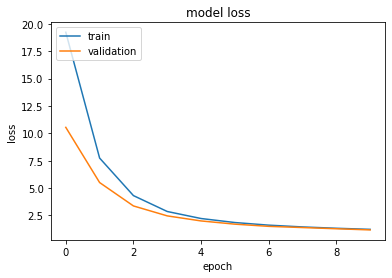

100%|██████████| 57/57 [00:14<00:00,  3.86it/s]


In [18]:
#True if we want to train the model
if True:
    # Training the model
    plateau = tf.keras.callbacks.ReduceLROnPlateau(
      monitor='val_loss', factor=0.5, patience=5, verbose = 1
    )
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1,
                                          patience=15)  # Early stopping (stops training when validation doesn't improve for {patience} epochs)
    save_best = tf.keras.callbacks.ModelCheckpoint(output_model_filepath, monitor='val_loss', save_best_only=True,
                                                mode='min', save_weights_only = True)  # Saves the best version of the model to disk (as measured on the validation data set)
          
    history = as_model.fit(train_datagen,
        epochs=10,     ##%%%%%%%%%%%&&&&&&////////((((((((((((EPOCH EPOCH))))))))))))
        validation_data=validation_datagen,
        shuffle=True,
        callbacks=[es, save_best, plateau])
    #Training history
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    
    as_model.load_weights(output_model_filepath)
    as_model.compute_threshold(train_datagen)
    as_model.save_weights(output_model_filepath)
else:
    
    as_model.build((None, *INPUT_SIZE,3))
    as_model.load_weights(input_model_filepath)
    as_model.compute_threshold(train_datagen)
    as_model.summary()
    as_model.autoencoder.summary()

In [19]:
 classes = ['bien', 'mal', ] #folder bien va primero, no anomaly class. folder mal, contiene anomalias.
test_datagen = ImageDataGenerator(rescale=1. / 255, data_format='channels_last')
test_generator = test_datagen.flow_from_directory("/content/drive/MyDrive/mask rotate/test", 
                                                  target_size = INPUT_SIZE,
                                                  batch_size = 1,
                                                  class_mode = 'sparse')

## /content/drive/MyDrive/screw/test 
## https://www.kaggle.com/danieldelro/anomalysegmention/data   provee model entrenado 9hs.anomaly-segmentation-model.h5

Found 144 images belonging to 2 classes.


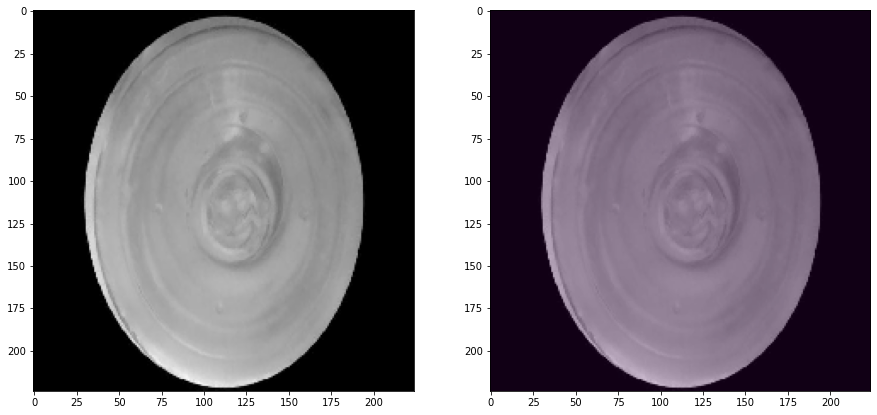

Threshold: 36225.0390625 MaxValue: 27745.248046875
GT: mal, anomaly detected: False


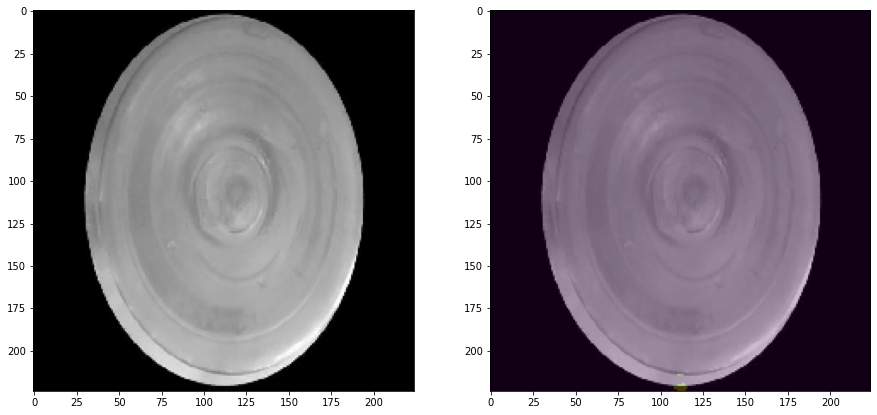

Threshold: 36225.0390625 MaxValue: 37331.87109375
GT: bien, anomaly detected: True


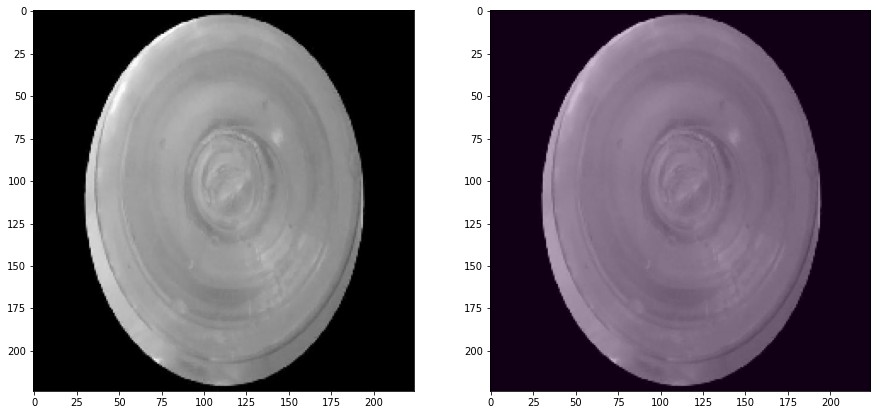

Threshold: 36225.0390625 MaxValue: 28397.66796875
GT: bien, anomaly detected: False


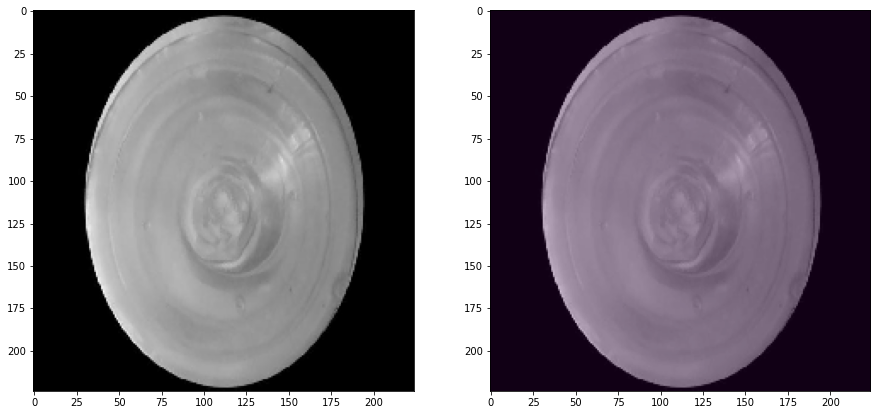

Threshold: 36225.0390625 MaxValue: 33540.796875
GT: mal, anomaly detected: False


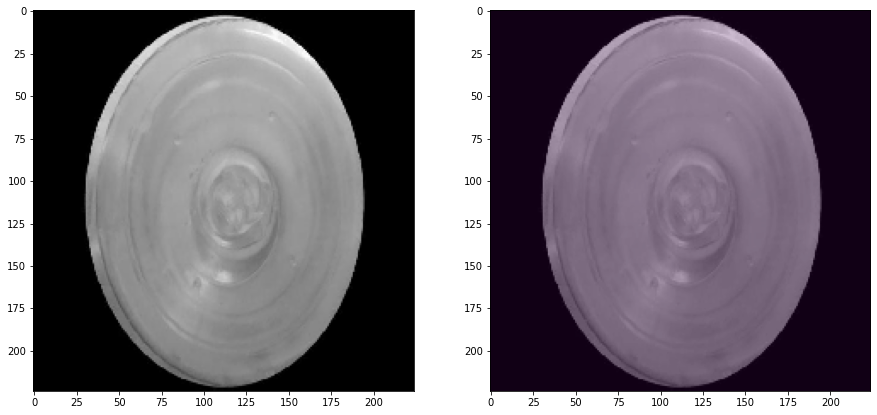

Threshold: 36225.0390625 MaxValue: 35791.76171875
GT: mal, anomaly detected: True


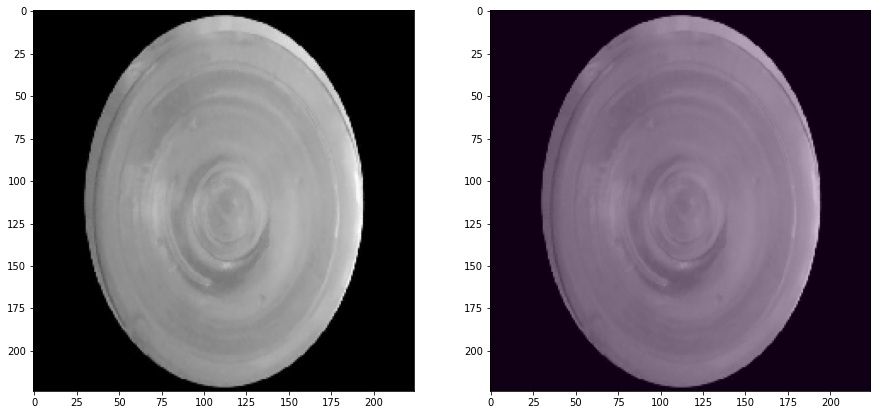

Threshold: 36225.0390625 MaxValue: 22790.3046875
GT: mal, anomaly detected: False


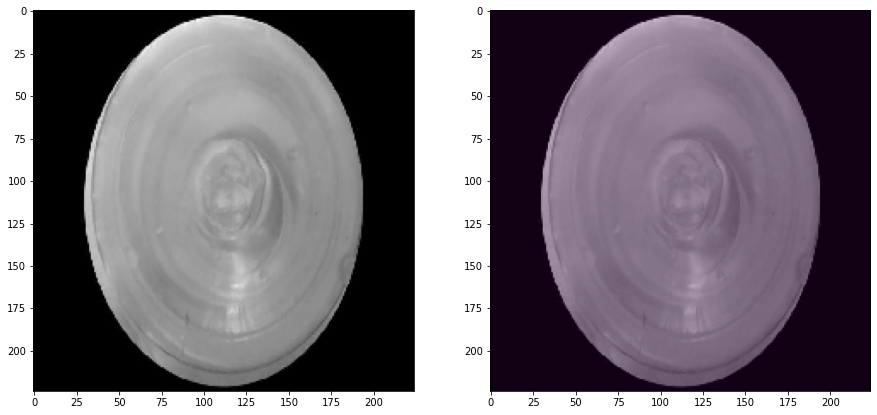

Threshold: 36225.0390625 MaxValue: 27118.462890625
GT: bien, anomaly detected: False


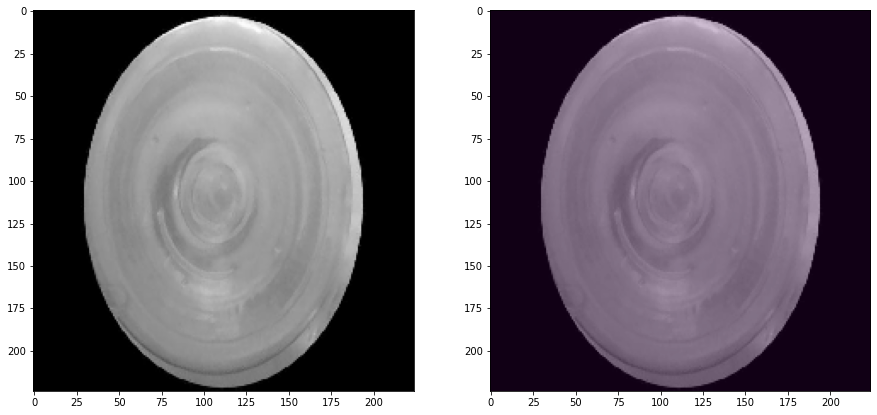

Threshold: 36225.0390625 MaxValue: 26072.37890625
GT: mal, anomaly detected: False


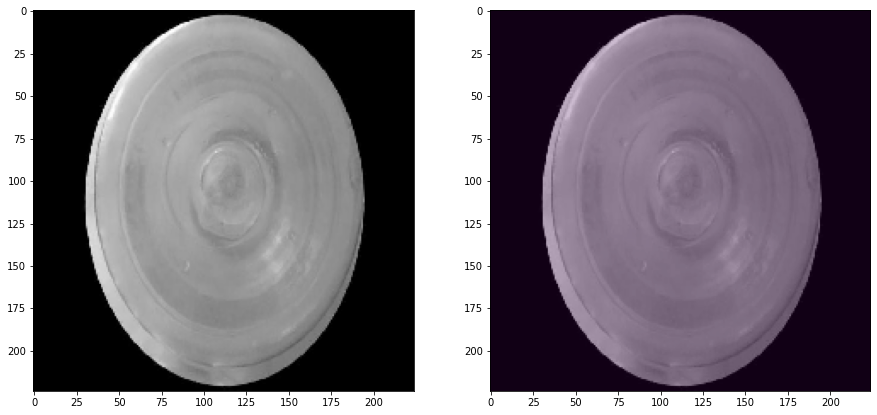

Threshold: 36225.0390625 MaxValue: 27388.826171875
GT: mal, anomaly detected: False


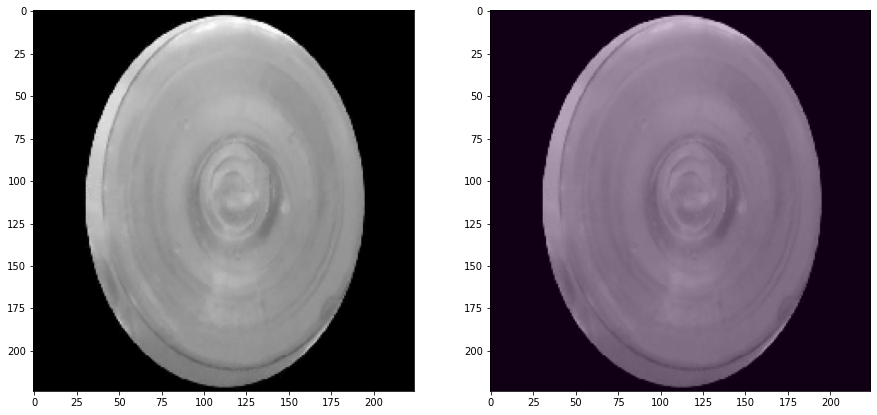

Threshold: 36225.0390625 MaxValue: 21558.869140625
GT: bien, anomaly detected: False


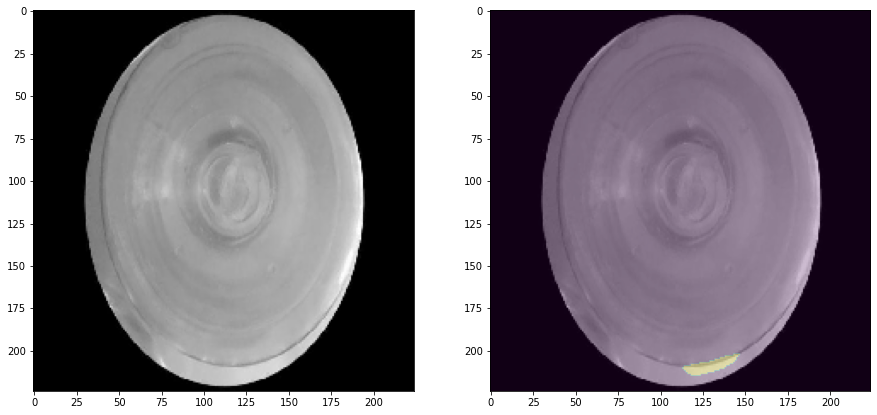

Threshold: 36225.0390625 MaxValue: 44196.26953125
GT: bien, anomaly detected: True


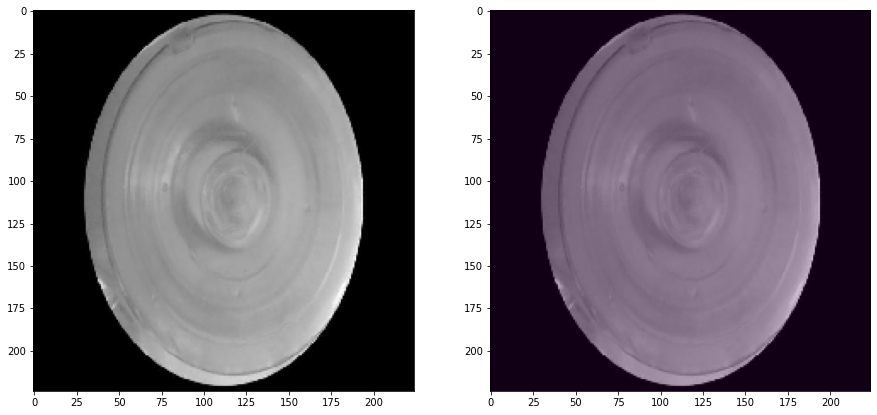

Threshold: 36225.0390625 MaxValue: 30694.517578125
GT: bien, anomaly detected: False


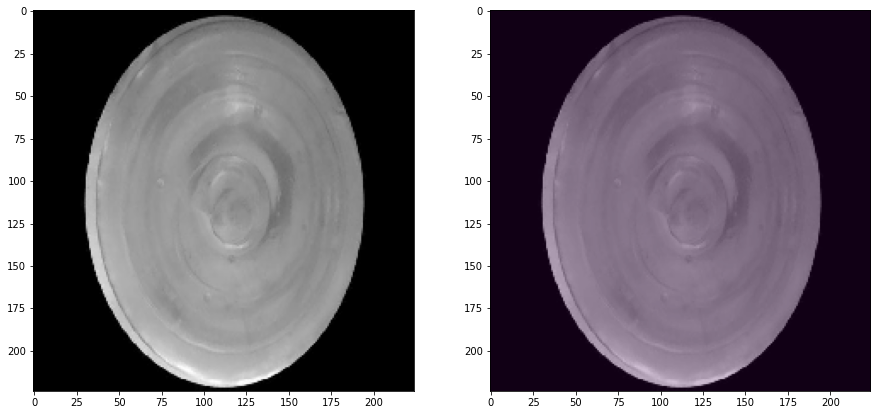

Threshold: 36225.0390625 MaxValue: 29324.6796875
GT: mal, anomaly detected: False


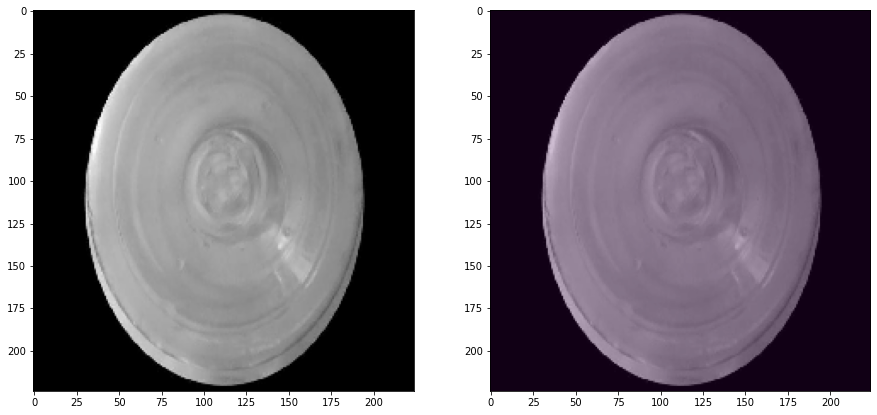

Threshold: 36225.0390625 MaxValue: 23708.318359375
GT: bien, anomaly detected: False


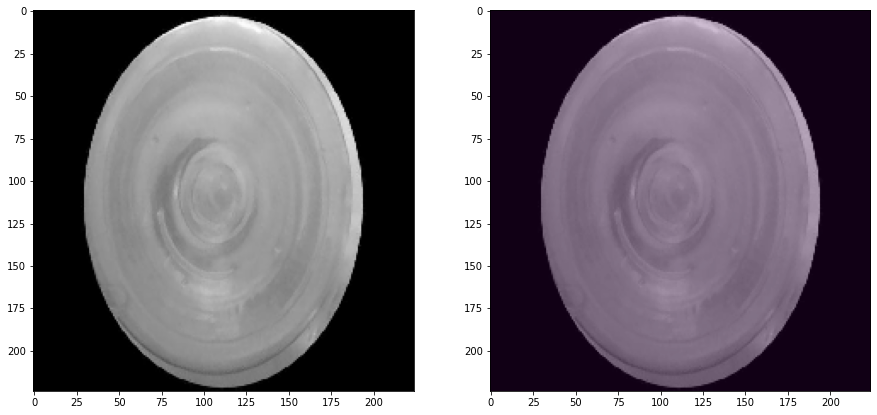

Threshold: 36225.0390625 MaxValue: 26072.37890625
GT: bien, anomaly detected: False


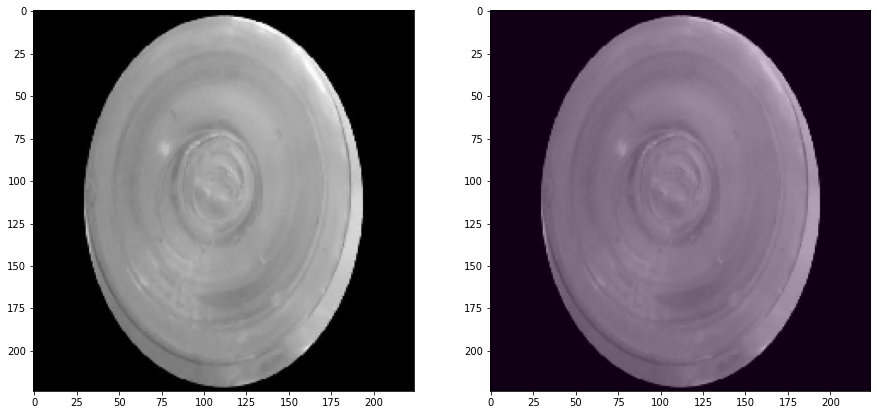

Threshold: 36225.0390625 MaxValue: 29387.65234375
GT: bien, anomaly detected: False


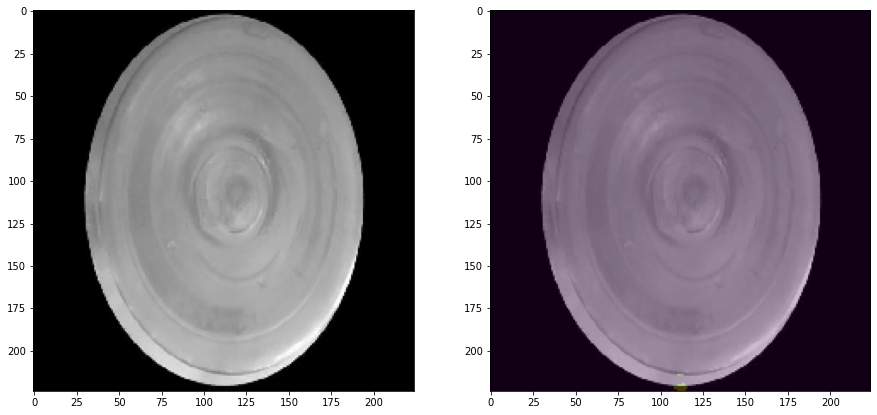

Threshold: 36225.0390625 MaxValue: 37331.87109375
GT: mal, anomaly detected: True


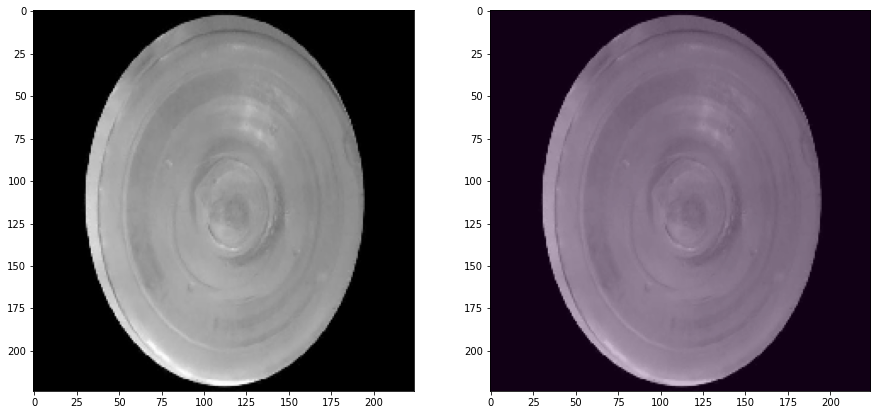

Threshold: 36225.0390625 MaxValue: 29738.45703125
GT: mal, anomaly detected: False


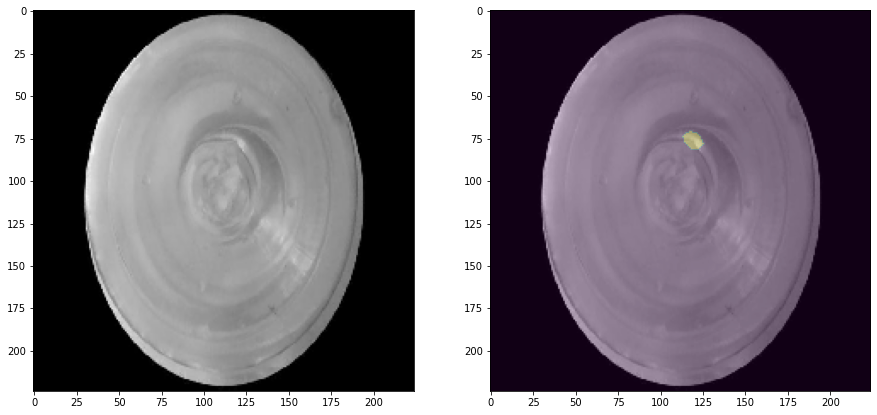

Threshold: 36225.0390625 MaxValue: 42662.171875
GT: bien, anomaly detected: True


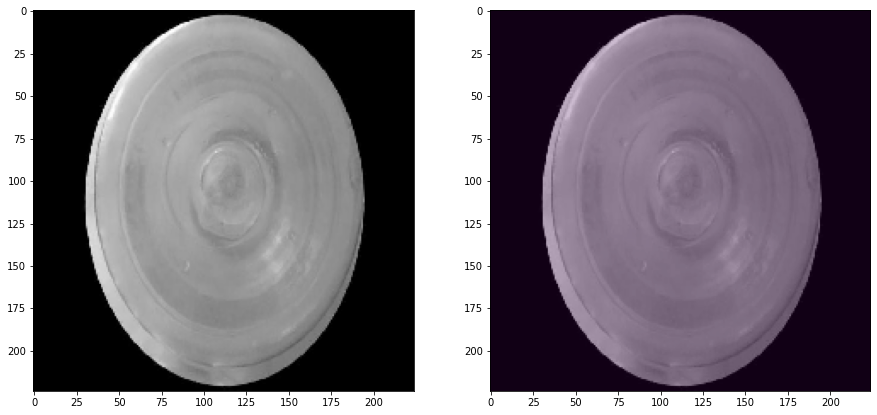

Threshold: 36225.0390625 MaxValue: 27388.826171875
GT: bien, anomaly detected: False


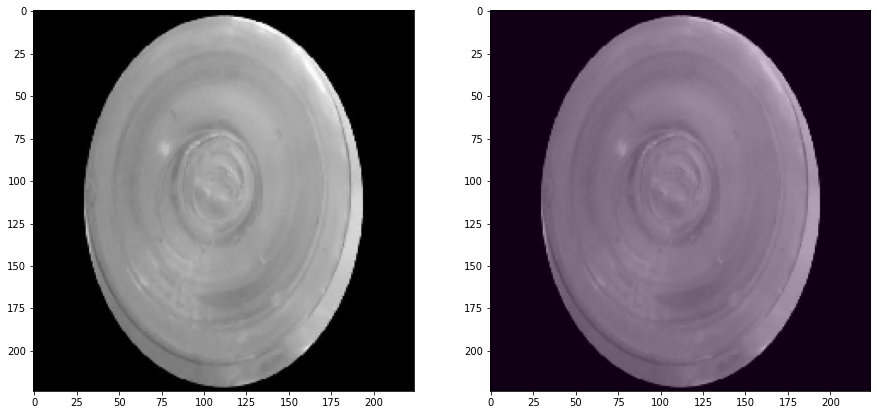

Threshold: 36225.0390625 MaxValue: 29387.65234375
GT: mal, anomaly detected: False


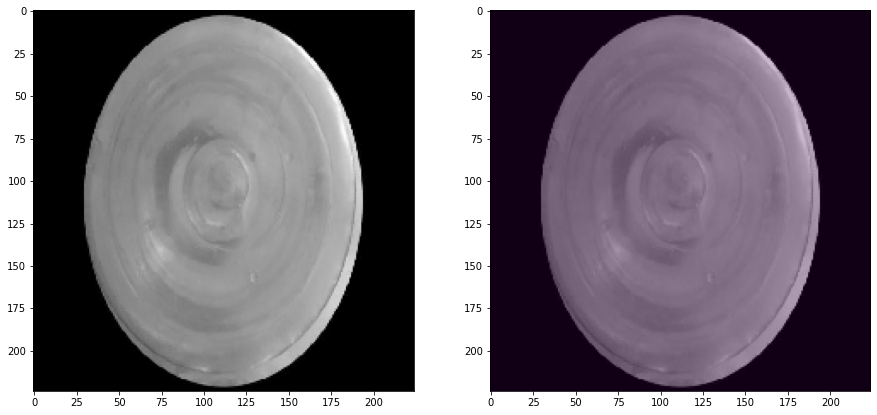

Threshold: 36225.0390625 MaxValue: 23275.236328125
GT: bien, anomaly detected: False


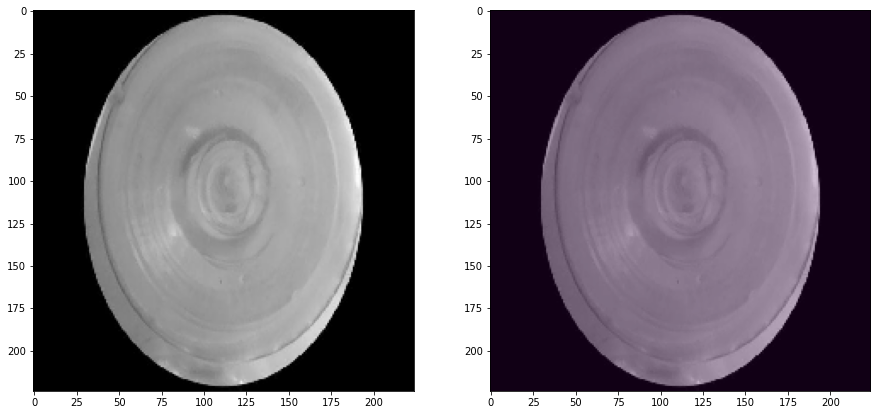

Threshold: 36225.0390625 MaxValue: 28377.322265625
GT: mal, anomaly detected: False


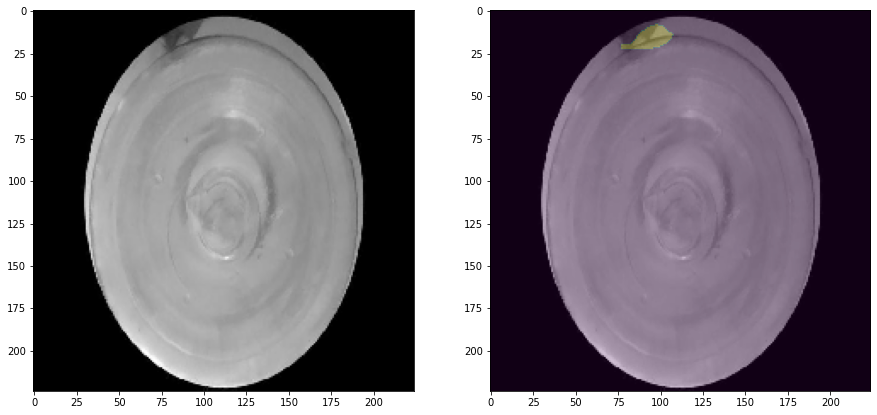

Threshold: 36225.0390625 MaxValue: 44517.01953125
GT: mal, anomaly detected: True


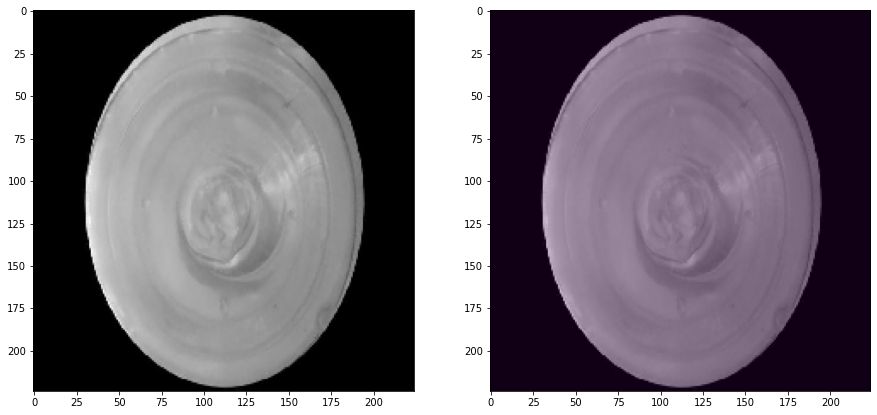

Threshold: 36225.0390625 MaxValue: 34930.6015625
GT: bien, anomaly detected: False


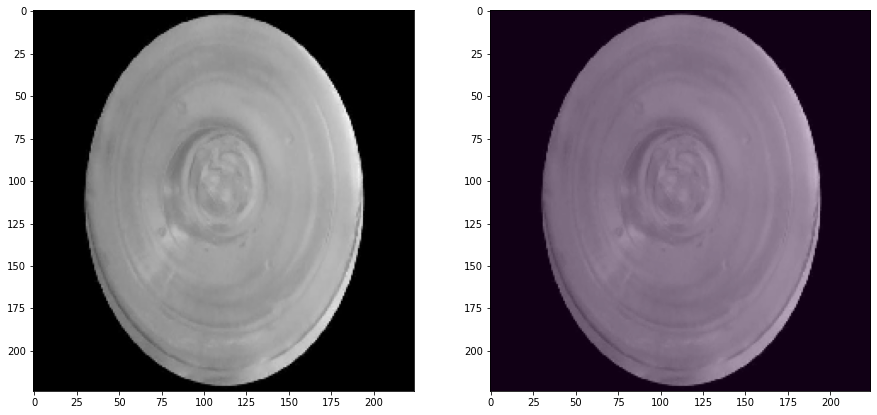

Threshold: 36225.0390625 MaxValue: 20996.38671875
GT: mal, anomaly detected: False


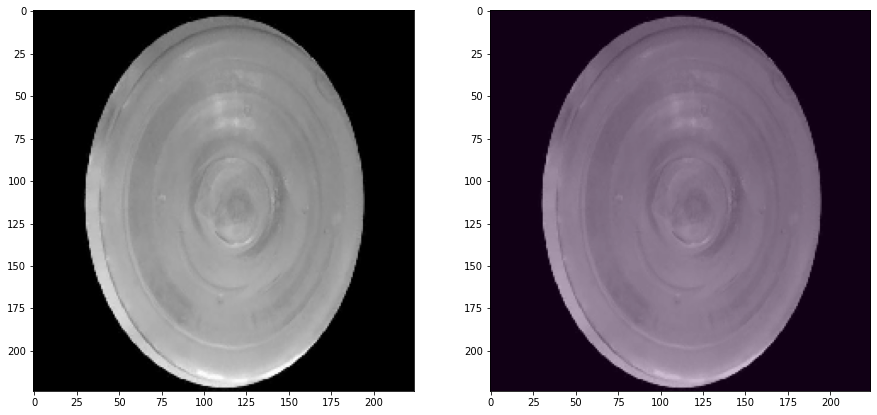

Threshold: 36225.0390625 MaxValue: 30864.060546875
GT: bien, anomaly detected: False


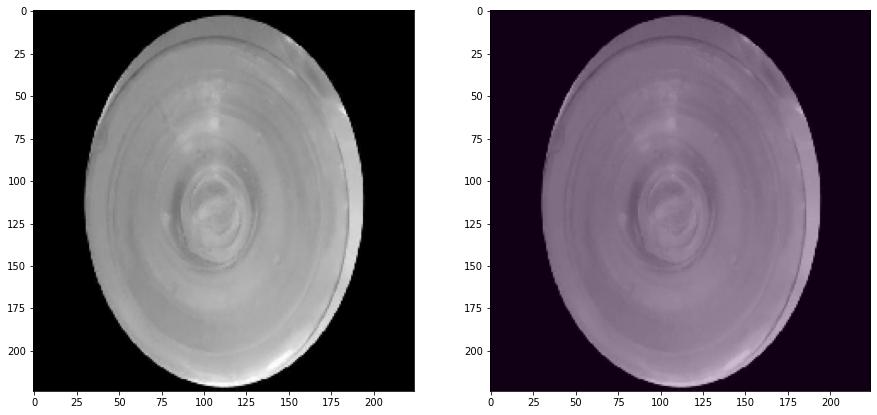

Threshold: 36225.0390625 MaxValue: 30141.470703125
GT: mal, anomaly detected: False


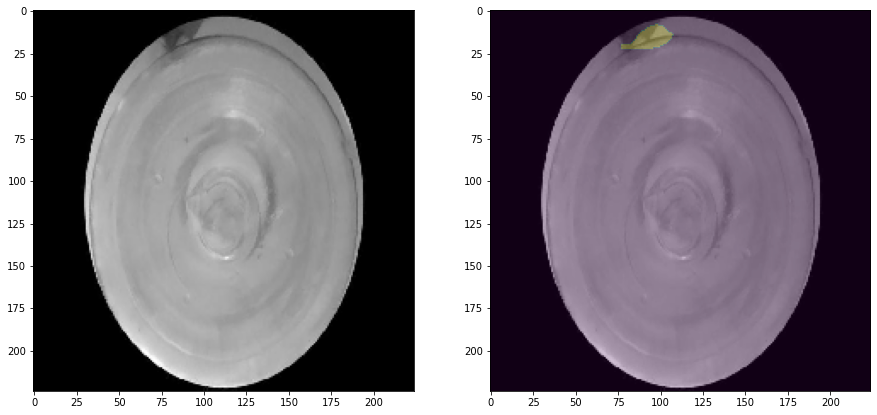

Threshold: 36225.0390625 MaxValue: 44517.01953125
GT: bien, anomaly detected: True


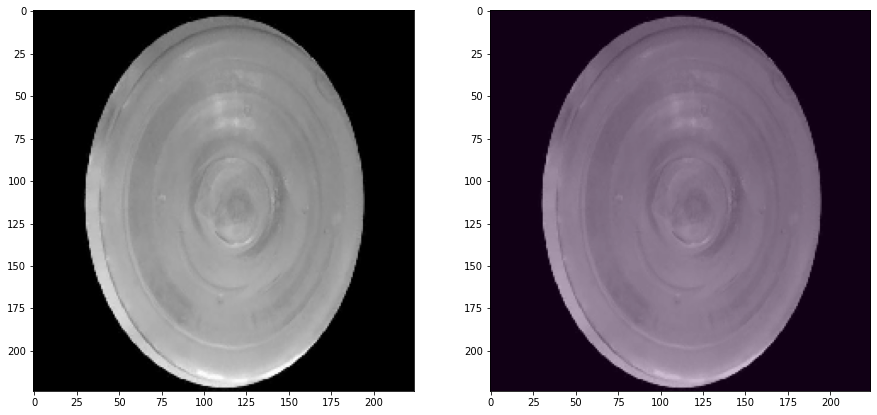

Threshold: 36225.0390625 MaxValue: 30864.060546875
GT: mal, anomaly detected: False


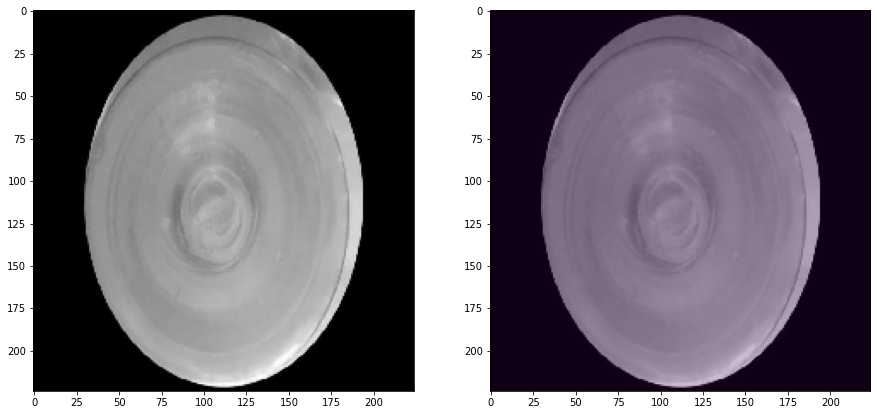

Threshold: 36225.0390625 MaxValue: 31297.806640625
GT: mal, anomaly detected: False


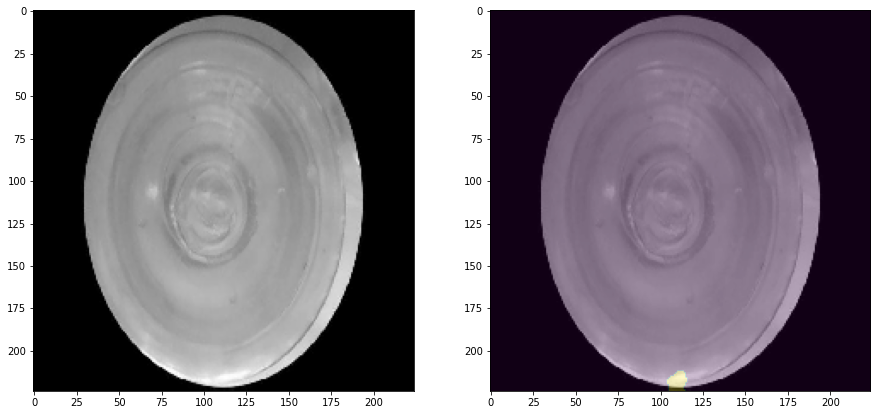

Threshold: 36225.0390625 MaxValue: 40525.55078125
GT: mal, anomaly detected: True


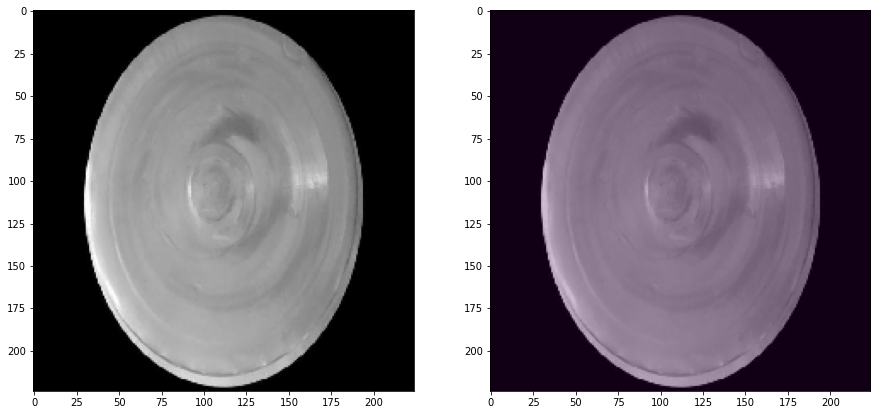

Threshold: 36225.0390625 MaxValue: 33308.16015625
GT: bien, anomaly detected: False


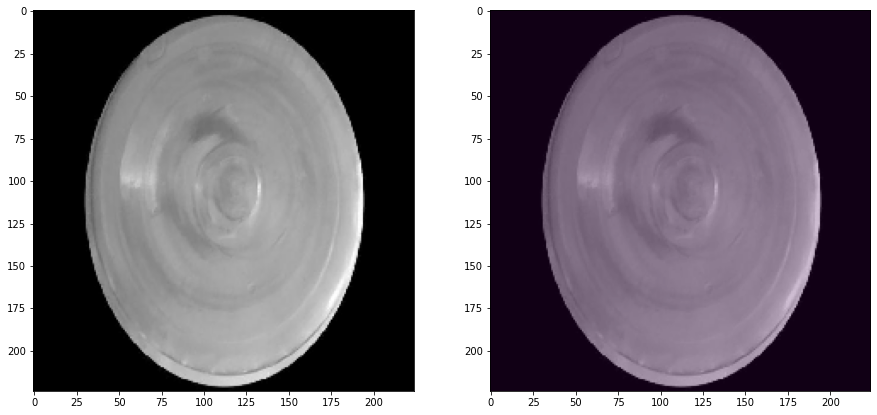

Threshold: 36225.0390625 MaxValue: 34260.34375
GT: mal, anomaly detected: False


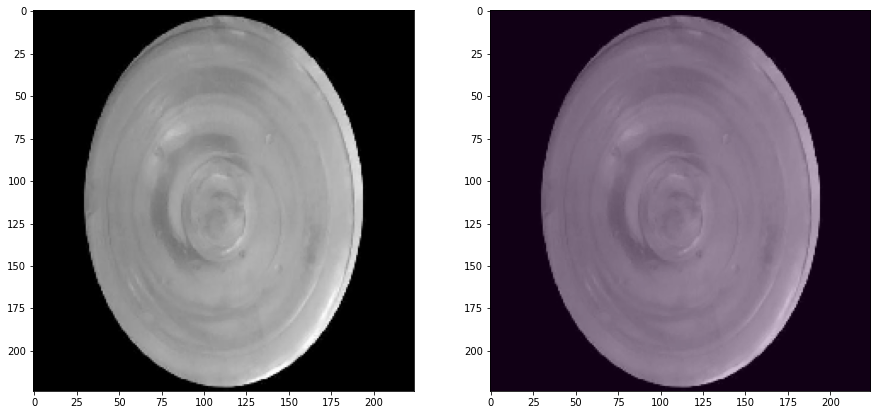

Threshold: 36225.0390625 MaxValue: 31306.18359375
GT: mal, anomaly detected: False


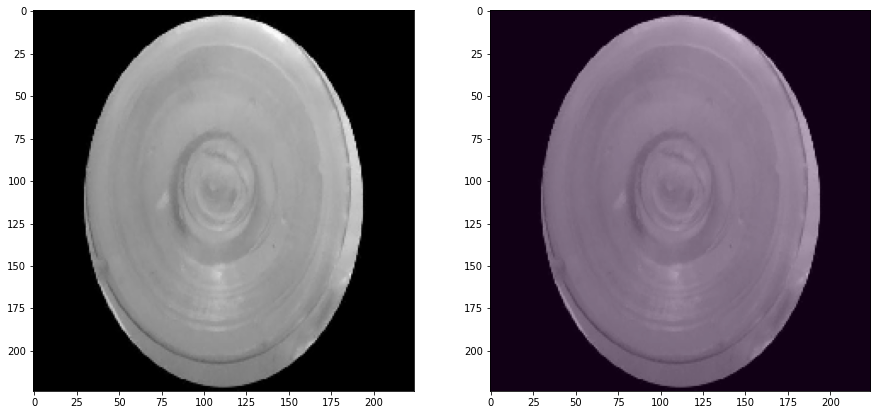

Threshold: 36225.0390625 MaxValue: 27793.455078125
GT: bien, anomaly detected: False


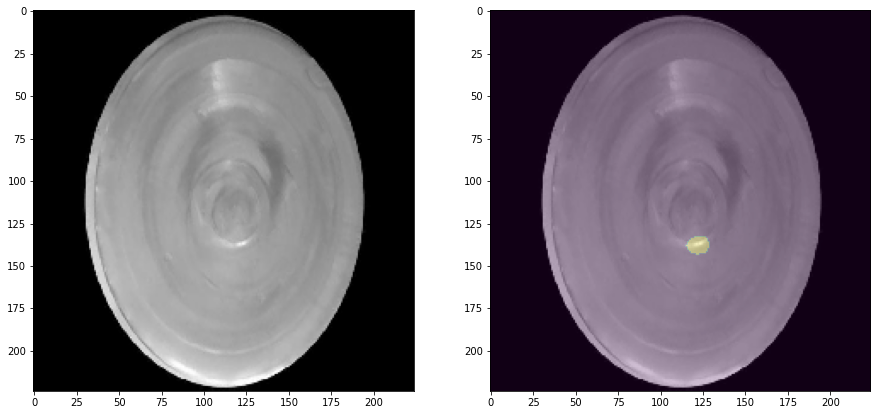

Threshold: 36225.0390625 MaxValue: 51975.87109375
GT: bien, anomaly detected: True


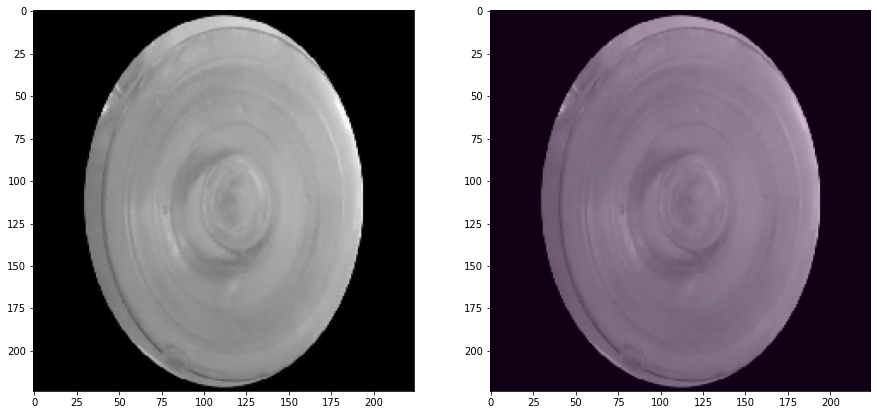

Threshold: 36225.0390625 MaxValue: 22556.064453125
GT: mal, anomaly detected: False


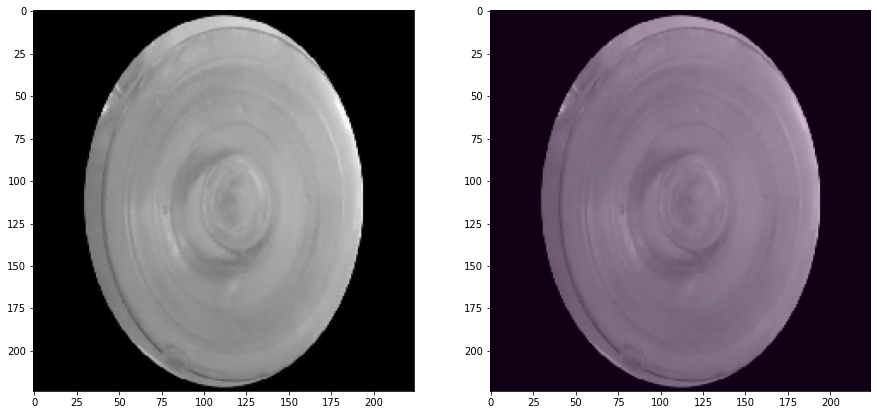

Threshold: 36225.0390625 MaxValue: 22556.064453125
GT: bien, anomaly detected: False


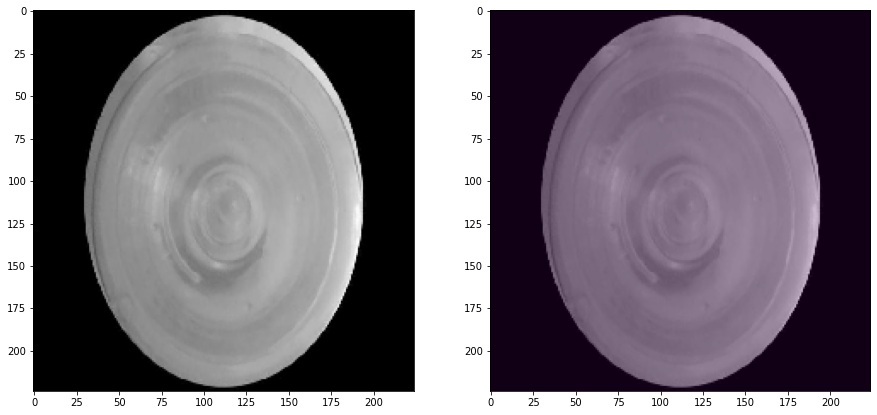

Threshold: 36225.0390625 MaxValue: 22130.908203125
GT: bien, anomaly detected: False


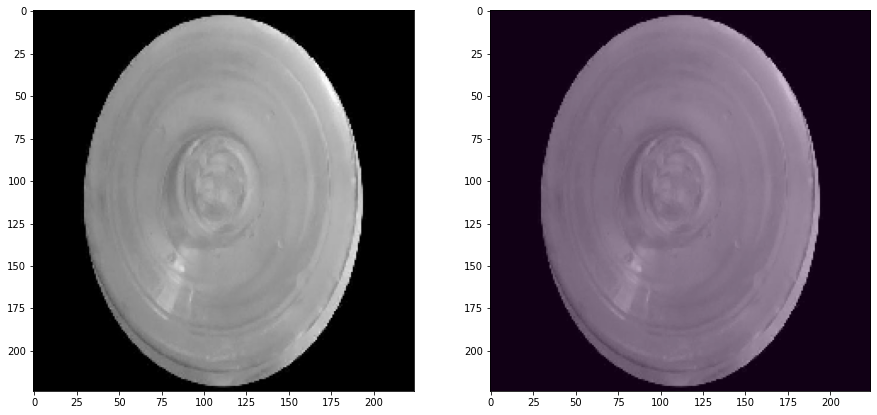

Threshold: 36225.0390625 MaxValue: 29156.654296875
GT: bien, anomaly detected: False


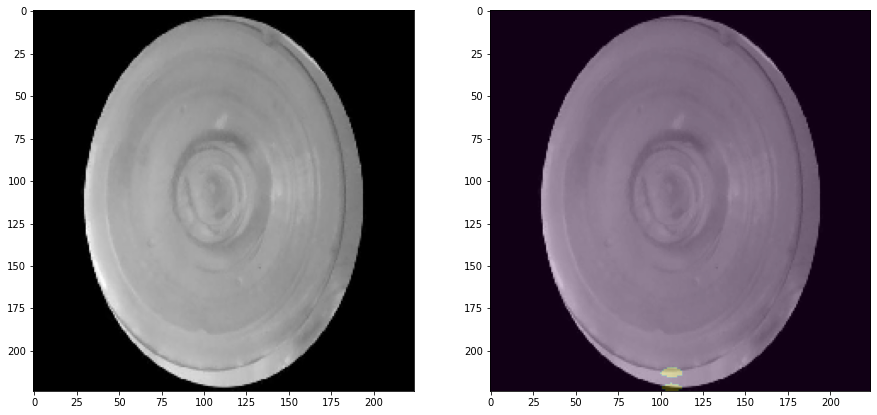

Threshold: 36225.0390625 MaxValue: 39471.359375
GT: mal, anomaly detected: True


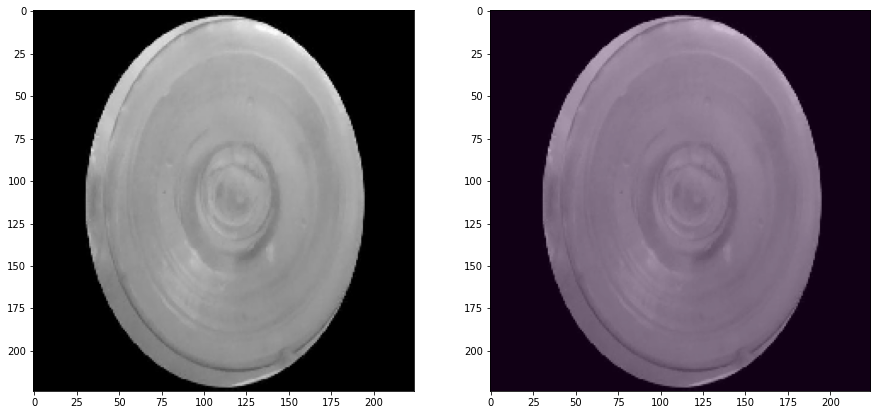

Threshold: 36225.0390625 MaxValue: 33195.91015625
GT: bien, anomaly detected: False


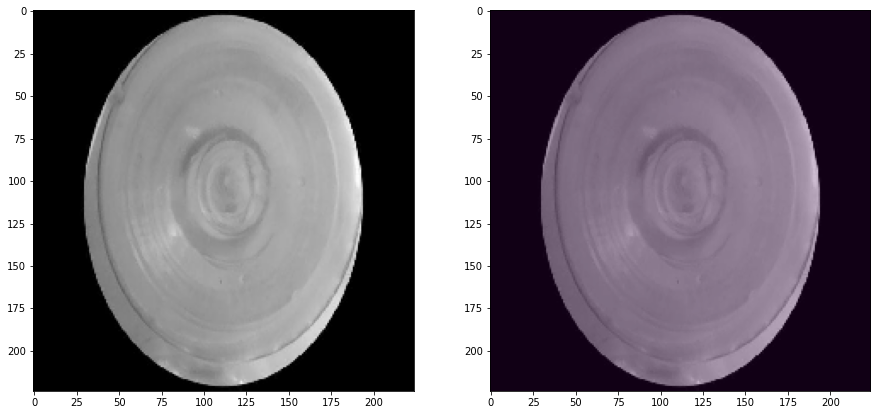

Threshold: 36225.0390625 MaxValue: 28377.322265625
GT: bien, anomaly detected: False


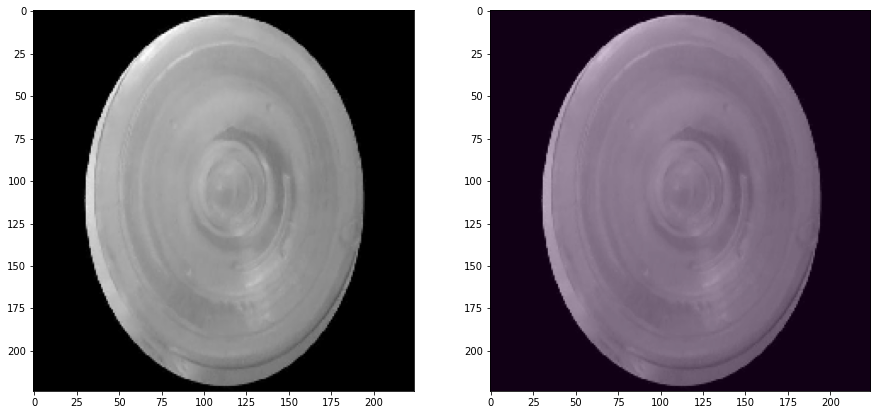

Threshold: 36225.0390625 MaxValue: 25982.92578125
GT: bien, anomaly detected: False


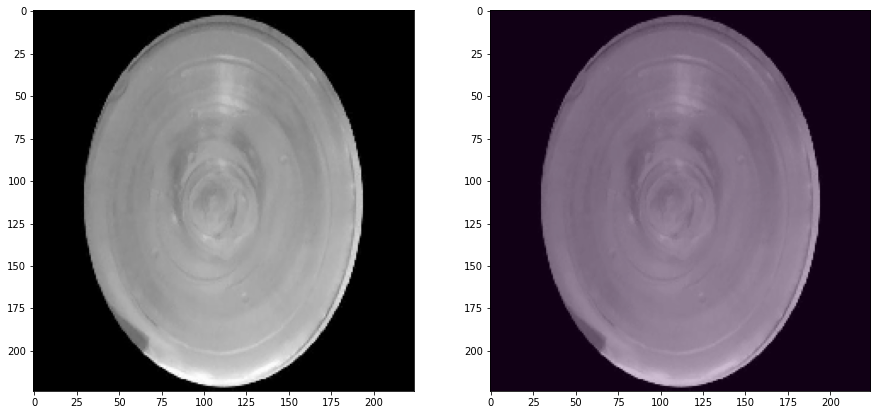

Threshold: 36225.0390625 MaxValue: 27117.154296875
GT: mal, anomaly detected: False


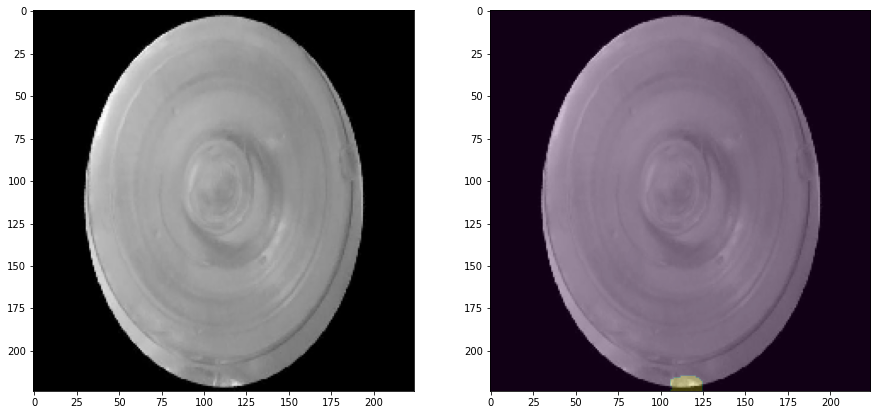

Threshold: 36225.0390625 MaxValue: 50592.58203125
GT: bien, anomaly detected: True


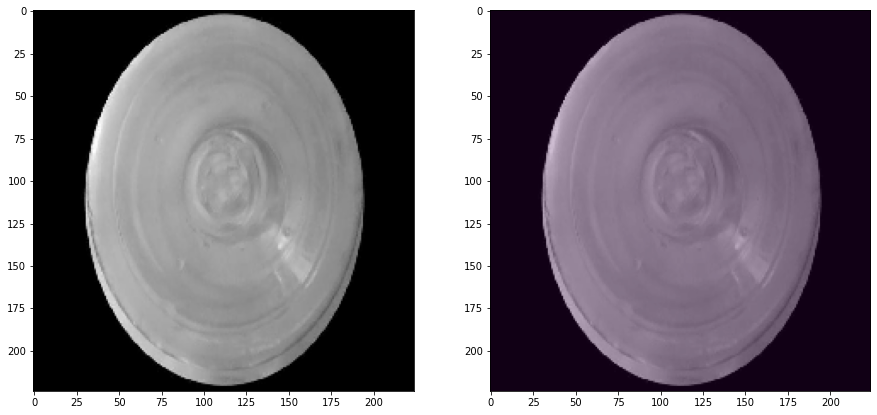

Threshold: 36225.0390625 MaxValue: 23708.318359375
GT: mal, anomaly detected: False


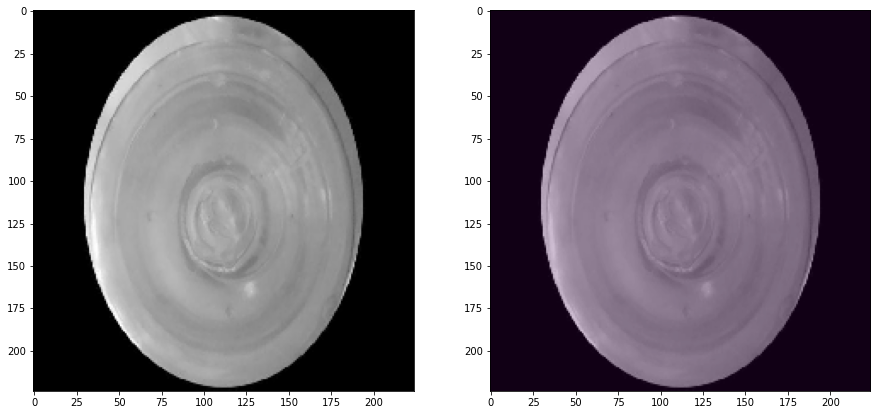

Threshold: 36225.0390625 MaxValue: 30838.279296875
GT: mal, anomaly detected: False


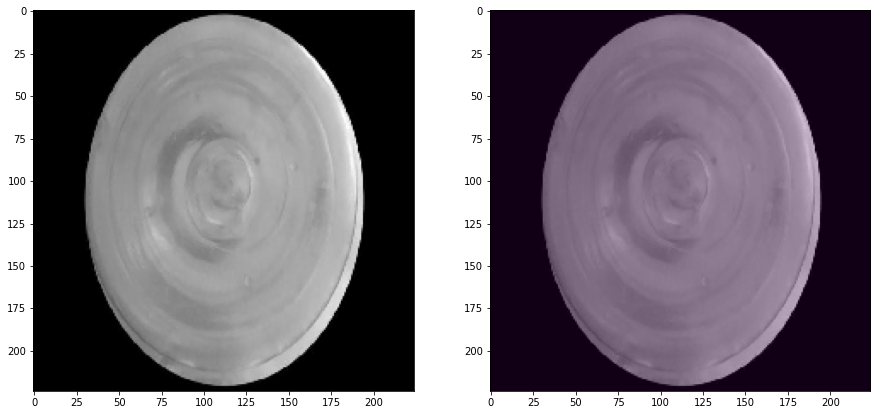

Threshold: 36225.0390625 MaxValue: 23009.625
GT: bien, anomaly detected: False


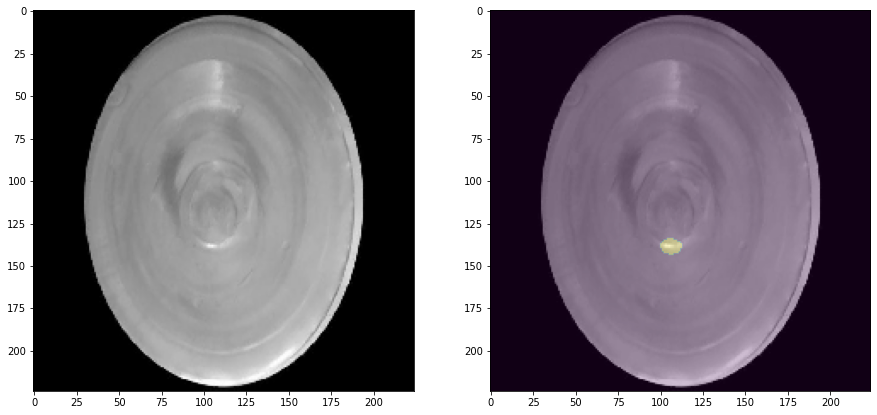

Threshold: 36225.0390625 MaxValue: 50316.41015625
GT: bien, anomaly detected: True


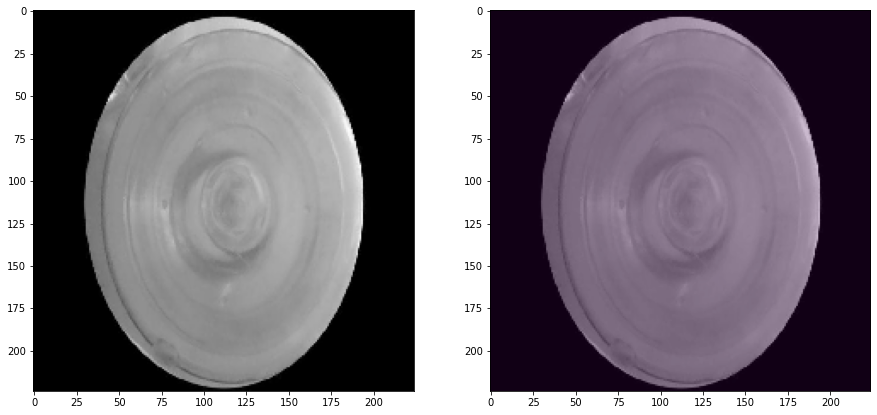

Threshold: 36225.0390625 MaxValue: 24260.80078125
GT: mal, anomaly detected: False


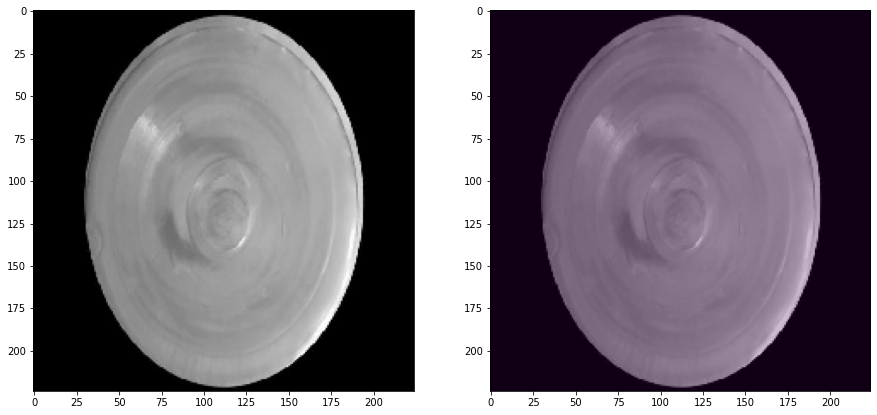

Threshold: 36225.0390625 MaxValue: 31255.798828125
GT: mal, anomaly detected: False


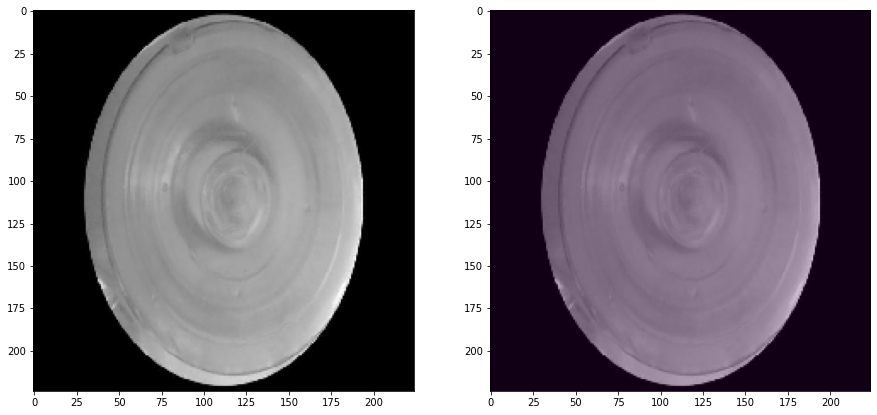

Threshold: 36225.0390625 MaxValue: 30694.517578125
GT: mal, anomaly detected: False


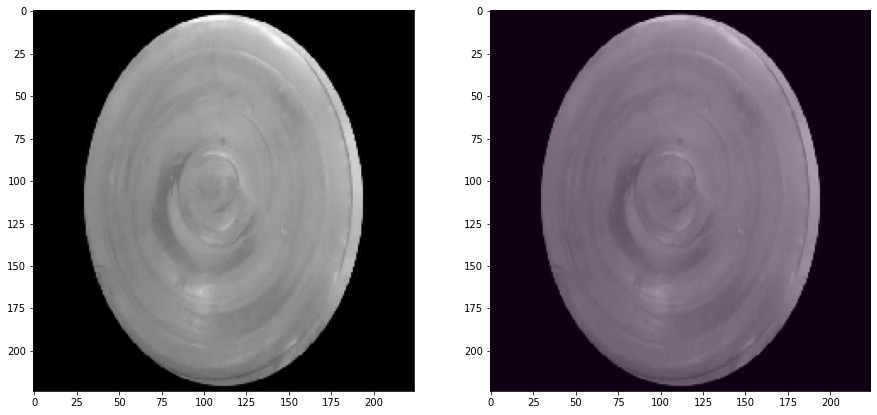

Threshold: 36225.0390625 MaxValue: 22924.080078125
GT: mal, anomaly detected: False


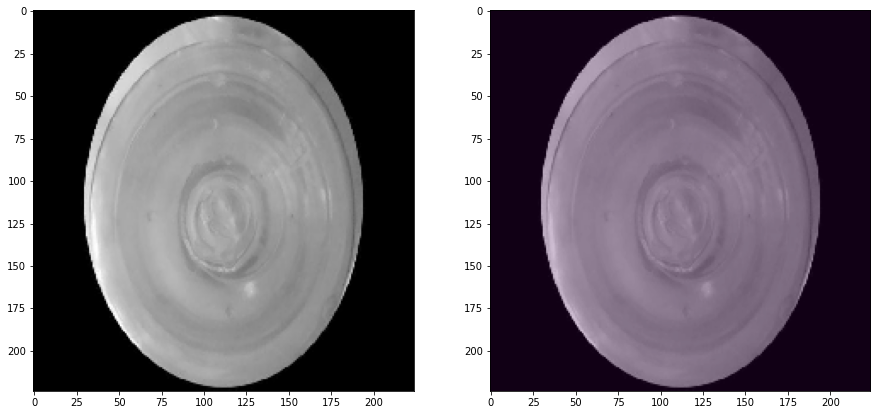

Threshold: 36225.0390625 MaxValue: 30838.279296875
GT: bien, anomaly detected: False


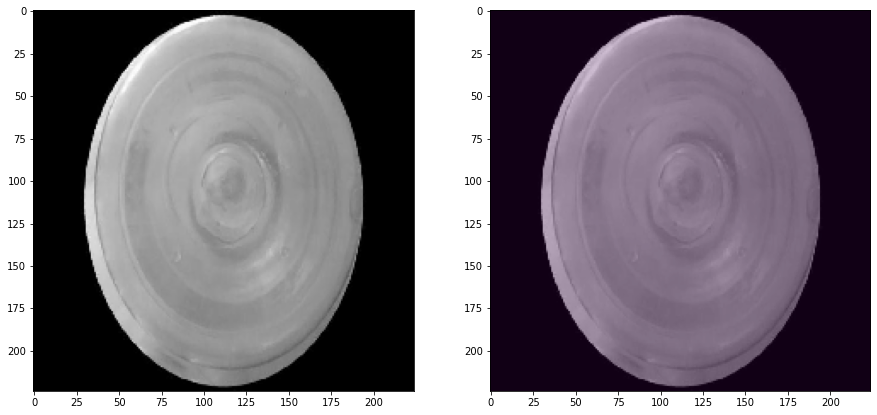

Threshold: 36225.0390625 MaxValue: 25732.998046875
GT: bien, anomaly detected: False


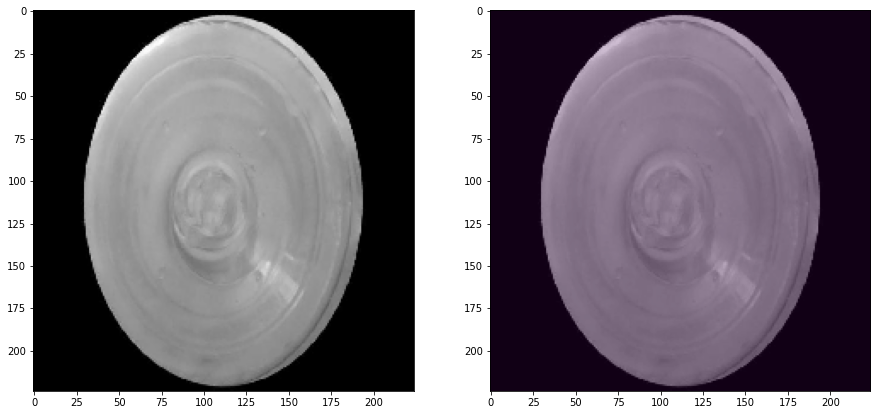

Threshold: 36225.0390625 MaxValue: 25626.3515625
GT: bien, anomaly detected: False


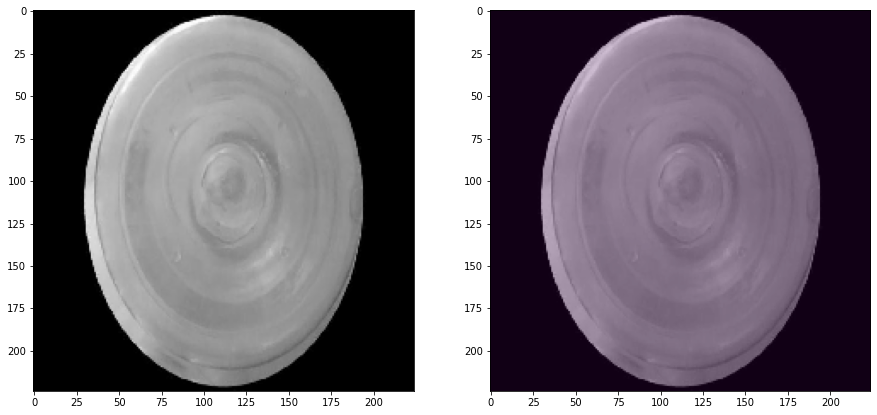

Threshold: 36225.0390625 MaxValue: 25732.998046875
GT: mal, anomaly detected: False


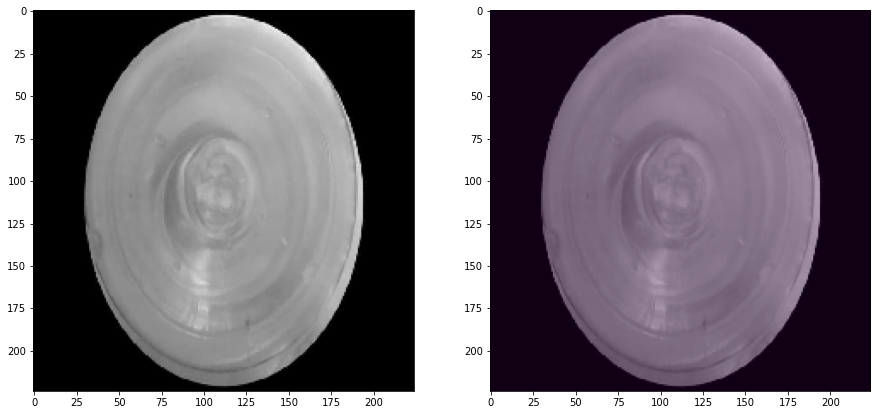

Threshold: 36225.0390625 MaxValue: 22706.498046875
GT: mal, anomaly detected: False


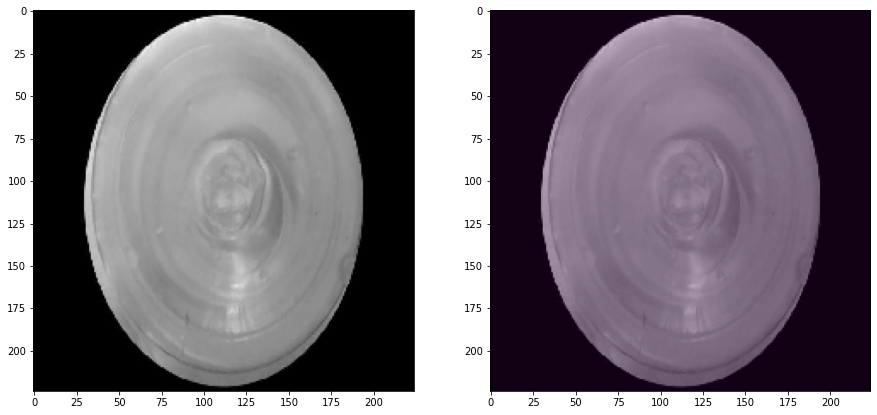

Threshold: 36225.0390625 MaxValue: 27118.462890625
GT: mal, anomaly detected: False


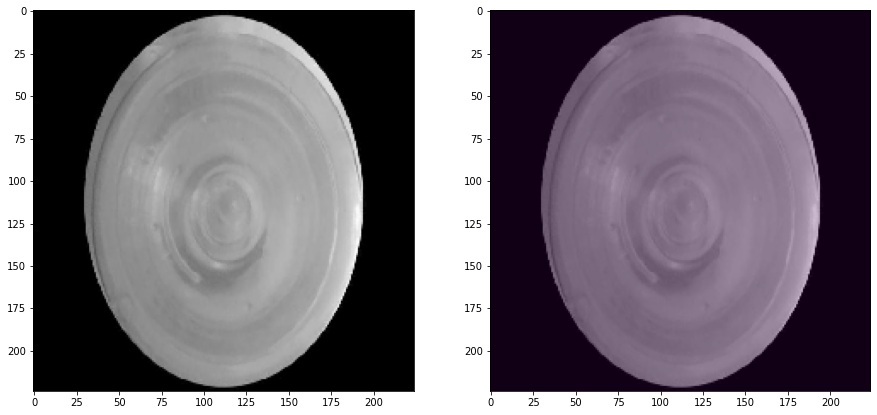

Threshold: 36225.0390625 MaxValue: 22130.908203125
GT: mal, anomaly detected: False


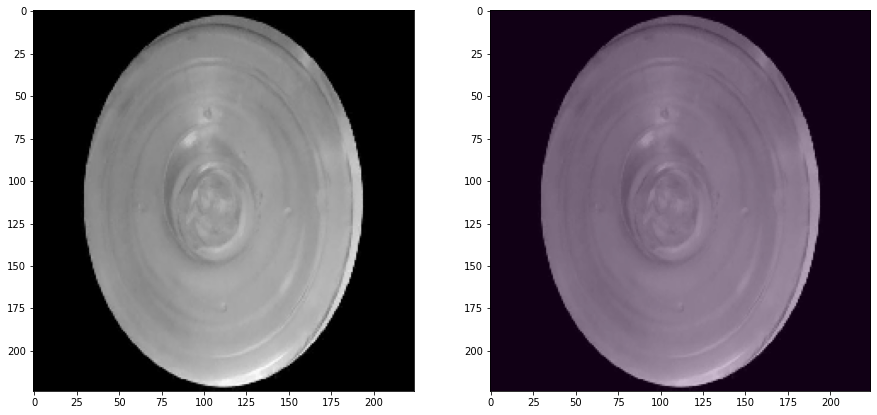

Threshold: 36225.0390625 MaxValue: 32680.94921875
GT: bien, anomaly detected: False


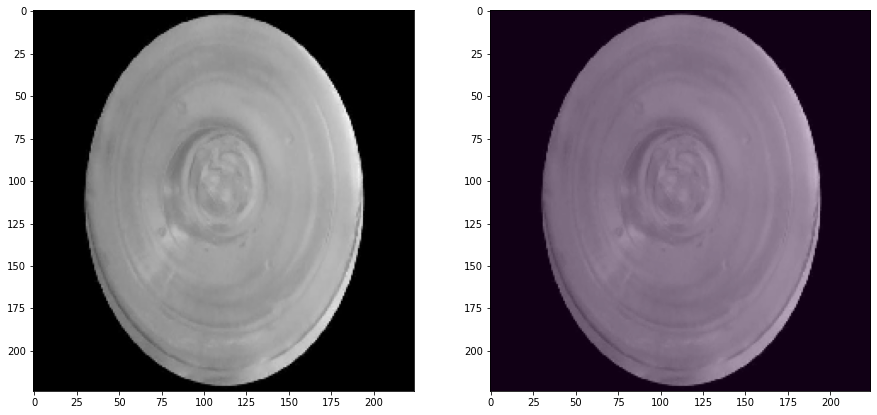

Threshold: 36225.0390625 MaxValue: 20996.38671875
GT: bien, anomaly detected: False


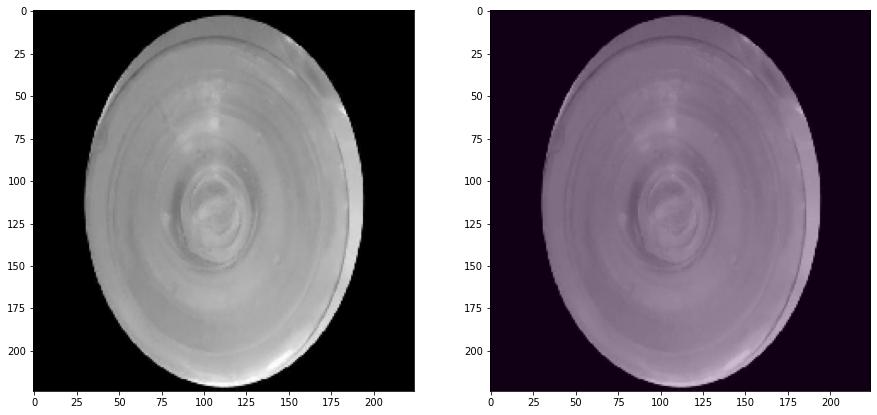

Threshold: 36225.0390625 MaxValue: 30141.470703125
GT: bien, anomaly detected: False


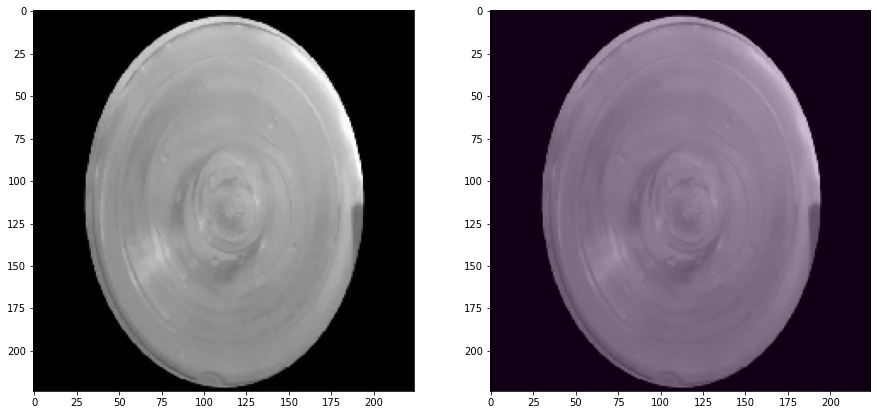

Threshold: 36225.0390625 MaxValue: 24665.1015625
GT: mal, anomaly detected: False


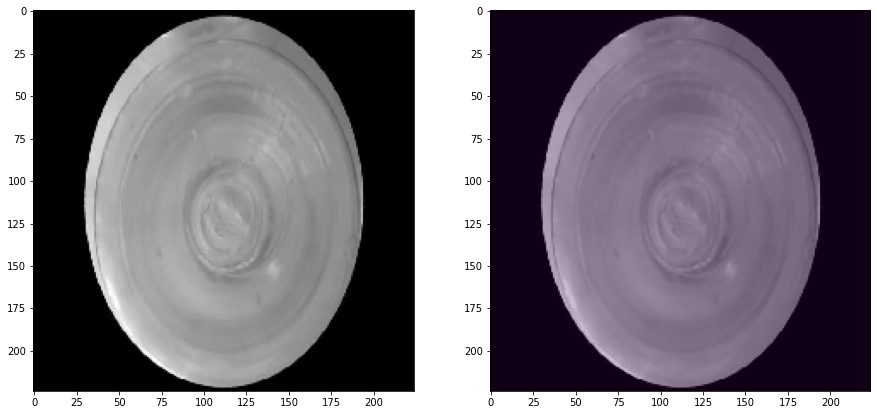

Threshold: 36225.0390625 MaxValue: 25033.001953125
GT: bien, anomaly detected: False


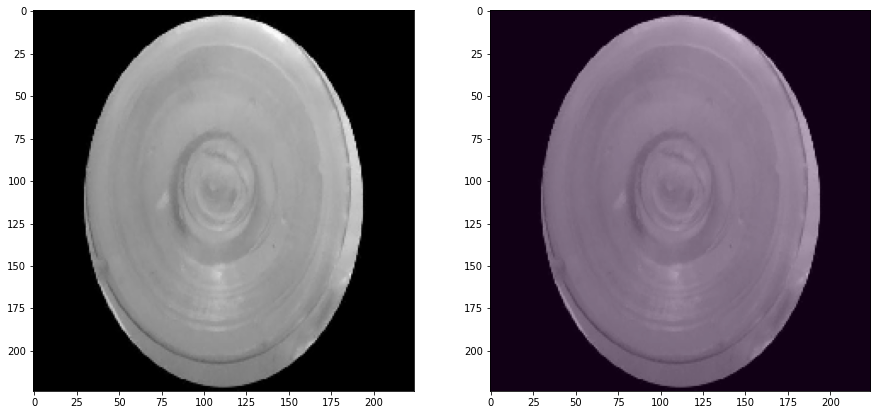

Threshold: 36225.0390625 MaxValue: 27793.455078125
GT: mal, anomaly detected: False


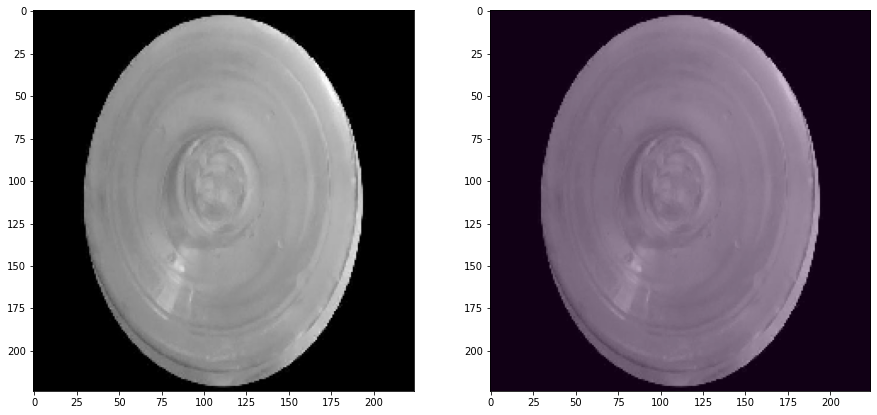

Threshold: 36225.0390625 MaxValue: 29156.654296875
GT: mal, anomaly detected: False


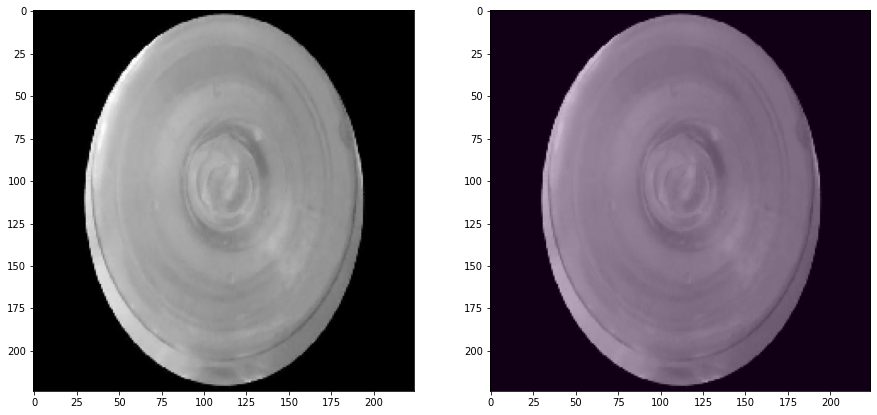

Threshold: 36225.0390625 MaxValue: 27169.412109375
GT: mal, anomaly detected: False


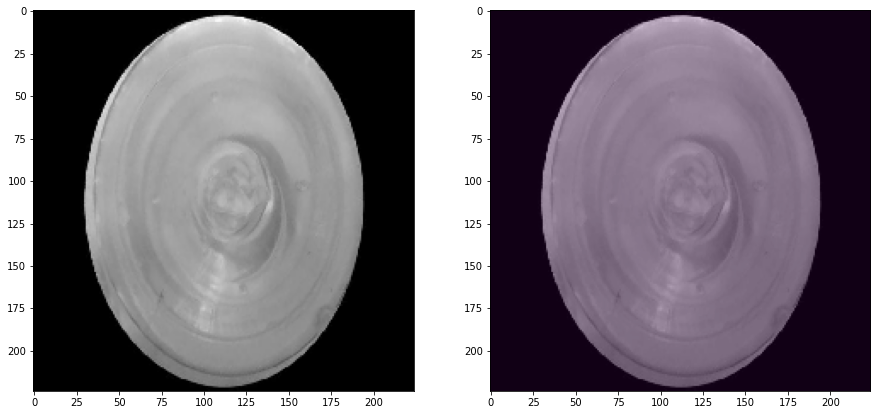

Threshold: 36225.0390625 MaxValue: 23072.095703125
GT: mal, anomaly detected: False


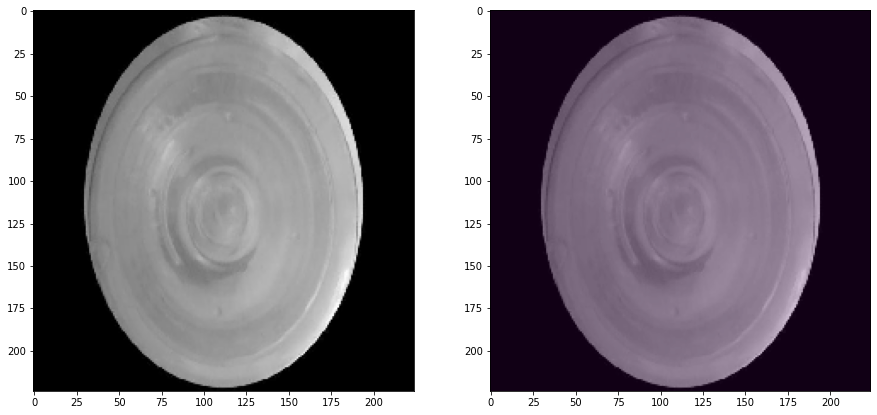

Threshold: 36225.0390625 MaxValue: 24373.75
GT: bien, anomaly detected: False


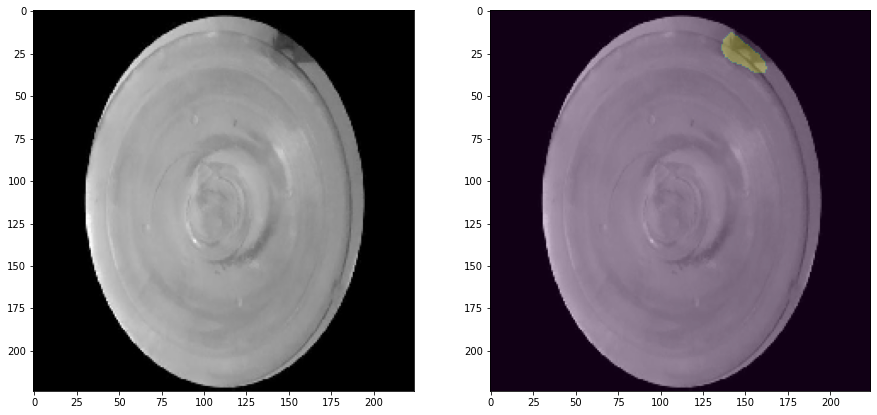

Threshold: 36225.0390625 MaxValue: 47272.99609375
GT: bien, anomaly detected: True


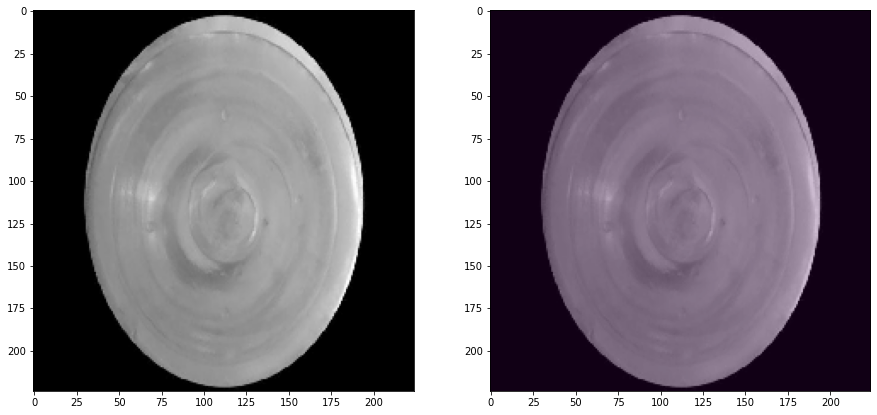

Threshold: 36225.0390625 MaxValue: 20393.58984375
GT: bien, anomaly detected: False


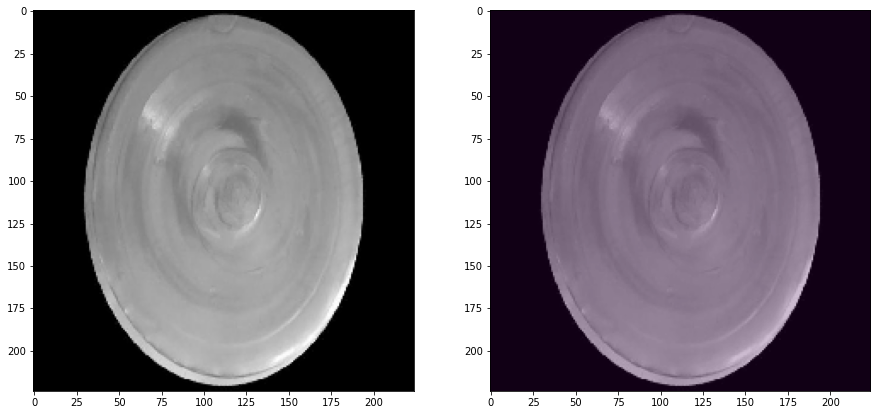

Threshold: 36225.0390625 MaxValue: 35696.75
GT: bien, anomaly detected: True


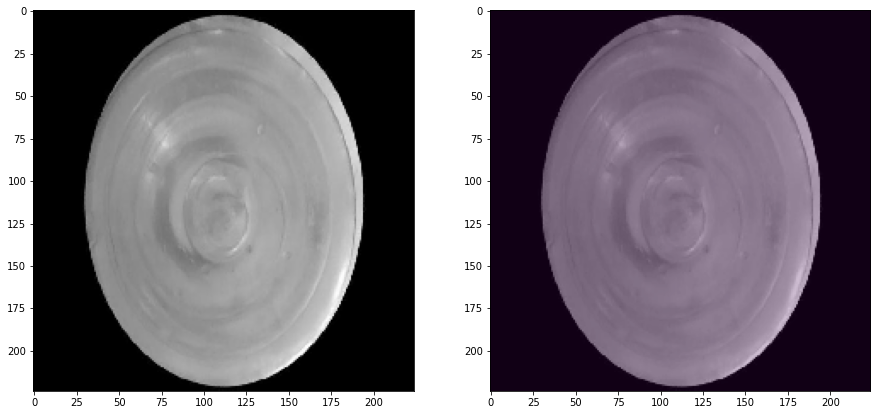

Threshold: 36225.0390625 MaxValue: 26787.53515625
GT: mal, anomaly detected: False


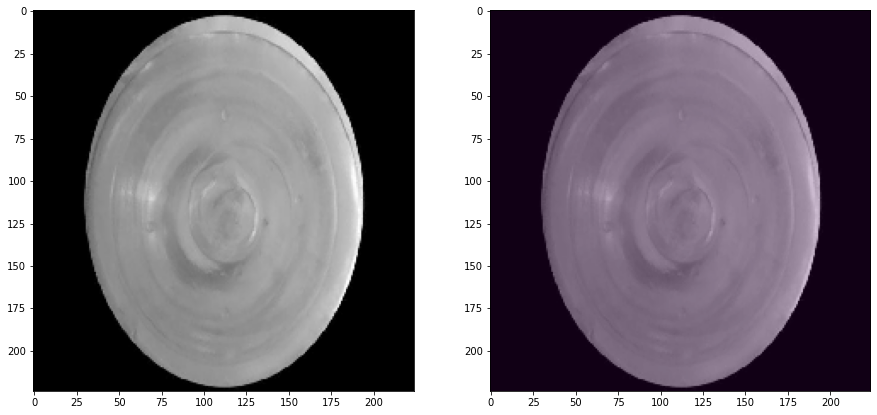

Threshold: 36225.0390625 MaxValue: 20393.58984375
GT: mal, anomaly detected: False


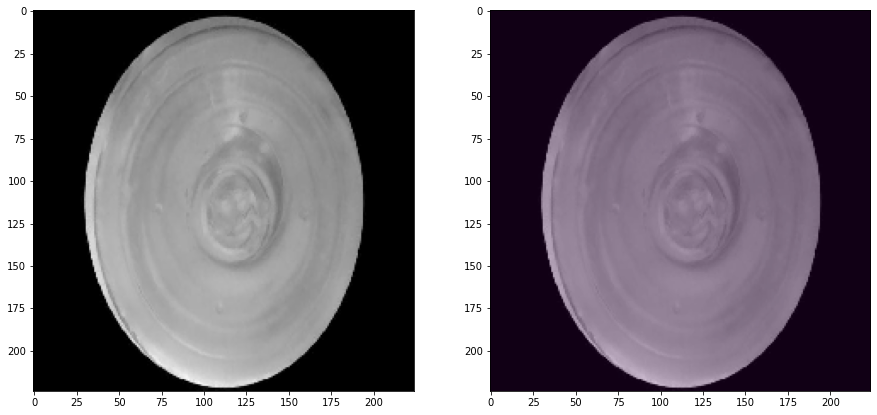

Threshold: 36225.0390625 MaxValue: 27745.248046875
GT: bien, anomaly detected: False


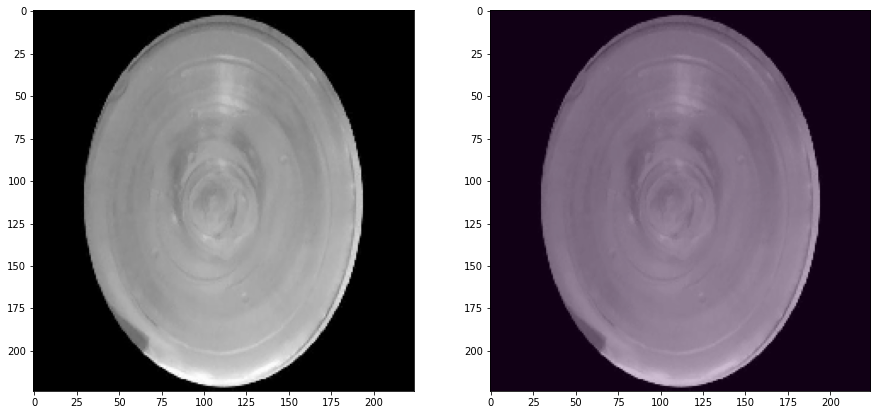

Threshold: 36225.0390625 MaxValue: 27117.154296875
GT: bien, anomaly detected: False


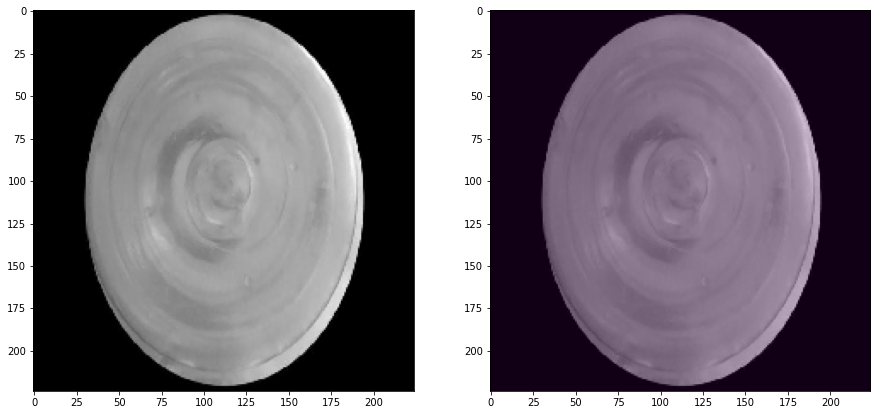

Threshold: 36225.0390625 MaxValue: 23009.625
GT: mal, anomaly detected: False


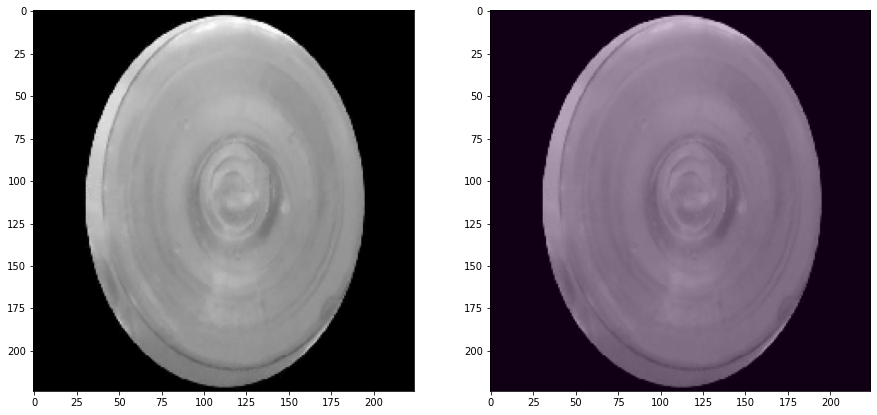

Threshold: 36225.0390625 MaxValue: 21558.869140625
GT: mal, anomaly detected: False


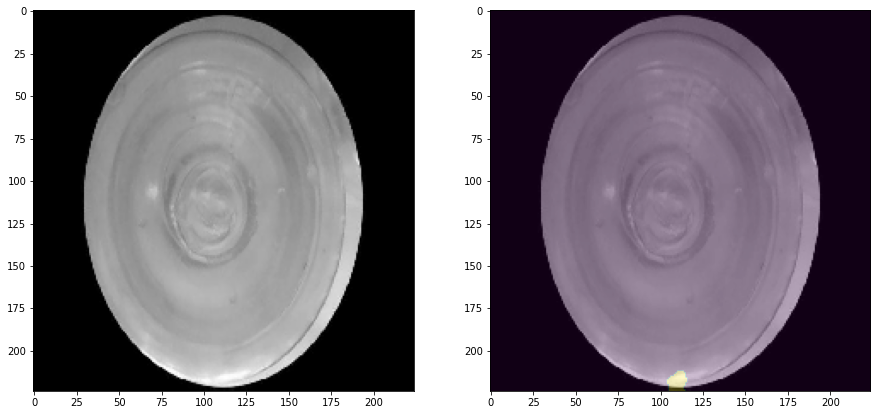

Threshold: 36225.0390625 MaxValue: 40525.55078125
GT: bien, anomaly detected: True


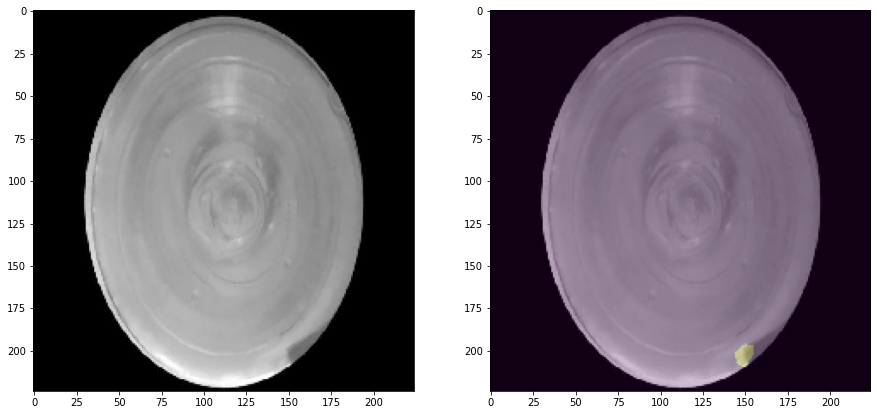

Threshold: 36225.0390625 MaxValue: 47292.640625
GT: bien, anomaly detected: True


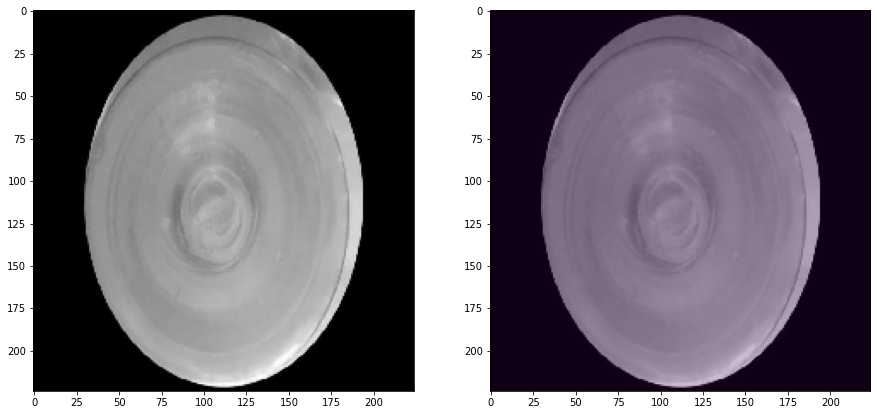

Threshold: 36225.0390625 MaxValue: 31297.806640625
GT: bien, anomaly detected: False


In [ ]:
for i in range(144):
    x_batch, y_batch = next(test_generator)    
    hotmaps = as_model(x_batch)
    for x, y, hotmap in zip(x_batch, y_batch, hotmaps):

        prediction = np.any(hotmap > as_model.threshold)

        hotmap = resize(hotmap, x.shape[:-1], anti_aliasing = True)
        mask = np.where(hotmap > as_model.threshold, 1, 0)
        

        f, axarr = plt.subplots(1,2, figsize=(15,15))
        axarr[0].imshow(x)
        axarr[1].imshow(mask)
        axarr[1].imshow(x, alpha = 0.75)
        plt.show()

        print(f"Threshold: {as_model.threshold.numpy()} MaxValue: {hotmap.max()}")
        print(f"GT: {classes[int(y)]}, anomaly detected: {prediction}")
       
    